# Analysis & Plotting
Functions to produce the various plots shown during our dicussions and the data processing steps involved.
Where applicable, csv files for re-plotting are written to output

In [1]:
from auxFns import styles as sy
from auxFns import tap1_auxfns

import random
import numpy as np
import polars as pl
import polars.selectors as cs
import scanpy as sc
import seaborn as sns
import fastcluster
import scipy.cluster.hierarchy as sch
import anndata as ad
import plotnine as pn
from plotnine import ggplot, aes,ggsave

import matplotlib.pyplot as plt
import pandas as pd



import random
def random_colors(n): #n is the number of colors you need to generate
    color_set = np.zeros((n,3))
    for i in range(n):
        r = random.uniform(0, 1)
        b = random.uniform(0, 1)
        g = random.uniform(0, 1)
        color_set[i] = [r,b,g]
    return color_set

In [2]:
# output_path = '/home/ubuntu/code/notebooks/tickets/TAP1/output'
output_path = '/Users/cameronpark/Desktop/output_v1'

In [3]:
import os
os.getcwd()

'/Users/cameronpark/Desktop/notebooks_v1'

In [4]:
adata = ad.read_h5ad(f'{output_path}/h5ad/inSitu/tap1_harmonized_dist-0.01_spread-1_fine_annotated.h5ad')
# adata.obs[adata.obs['cell_id'].str.contains('R13_post')]

In [5]:
### combine AML and Myeloid
adata.obs['transferred_ctype'] = adata.obs['transferred_ctype'].astype('str')
aml = adata[adata.obs.transferred_ctype == "AML"]
myeloid = adata[adata.obs.transferred_ctype == "Myeloid"]
adata.obs.loc[aml.obs.index,'transferred_ctype'] = "AML/Myeloid"
adata.obs.loc[myeloid.obs.index,'transferred_ctype'] = "AML/Myeloid"

adata.obs['transferred_ctype'] = adata.obs['transferred_ctype'].astype('category')

In [6]:
np.unique(adata.obs['celltype_fine'])

array(['AML', 'CD4 T-cell', 'CD8 Memory', 'CD8 TEMRA', 'Erythroid',
       'Fibroblast', 'Macrophage', 'Megakaryocyte', 'Monocyte', 'Myeloid',
       'NK-cell', 'Naive B-cell', 'Plasma B-cell', 'Transitional B-cell'],
      dtype=object)

In [7]:
adata.obs['celltype_fine'] = adata.obs['celltype_fine'].astype('str')
aml = adata[adata.obs.celltype_fine == "AML"]
myeloid = adata[adata.obs.celltype_fine == "Myeloid"]
adata.obs.loc[aml.obs.index,'celltype_fine'] = "AML/Myeloid"
adata.obs.loc[myeloid.obs.index,'celltype_fine'] = "AML/Myeloid"

adata.obs['celltype_fine'] = adata.obs['celltype_fine'].astype('category')

In [8]:
np.unique(adata.obs['transferred_ctype'])

array(['AML/Myeloid', 'Erythroid', 'Fibroblast', 'Macrophage',
       'Megakaryocyte', 'Monocyte', 'Naive B-cell', 'Plasma B-cell',
       'T-cell', 'Transitional B-cell'], dtype=object)

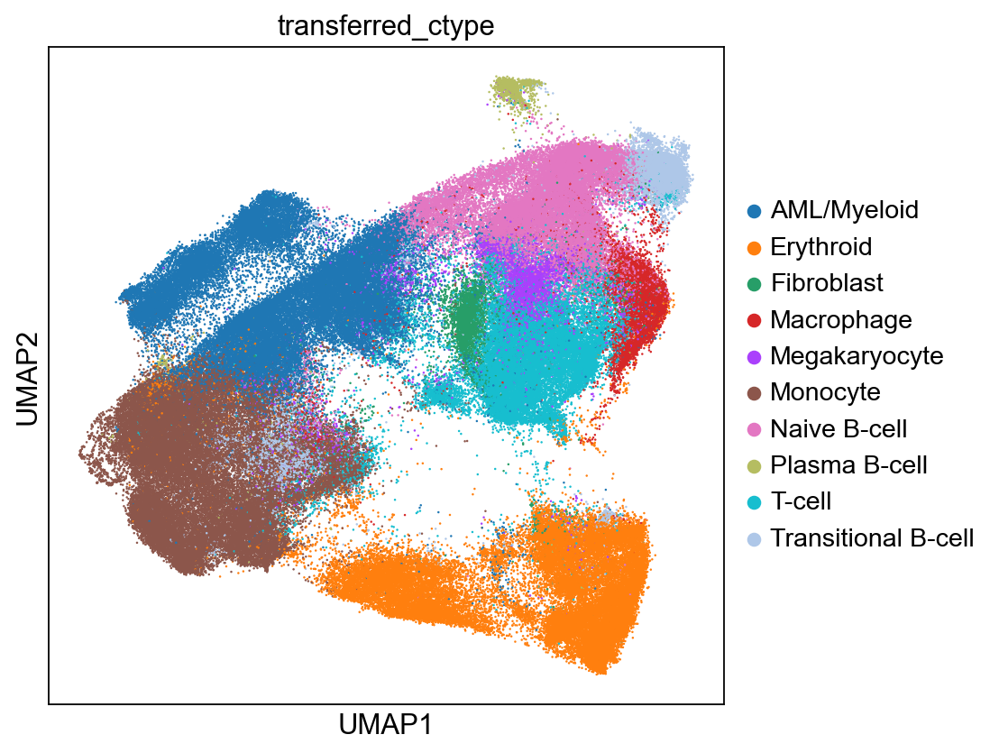

In [9]:
sc.set_figure_params(figsize=[6,6])

sc.pl.umap(
    adata,
    color=['transferred_ctype'],
    size=5,
    palette=sc.pl.palettes.default_20,
    # save = "umap_sg.pdf"
)

In [10]:
adata[adata.obs['transferred_ctype']=='T-cell']

View of AnnData object with n_obs × n_vars = 24554 × 158
    obs: 'nuclei_area', 'cell_x', 'cell_y', 'nuclei_expanded_area', 'expanded_cell_x', 'expanded_cell_y', 'CD8_intensity_mean', 'HLA-DR_intensity_mean', 'CD4_intensity_mean', 'CD3_intensity_mean', 'PanCK_intensity_mean', 'ATPase_intensity_mean', 'CD20_intensity_mean', 'KI67_intensity_mean', 'CD45RA_intensity_mean', 'GZMB_intensity_mean', 'CD34_intensity_mean', 'TIGIT_intensity_mean', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_counts', 'sample_id', 'patient', 'timepoint', 'group', 'tissue', 'run', 'fc', 'lane', 'n_genes', 'leiden', 'pDC_score', 'Classical Monocytes_score', 'Unconventional T Cell_score', 'Naive B Cell_score', 'Neutrophils_score', 'CD8 T Central Memory_score', 'Naive B_score', 'CD4 T Progenitor Exhausted_score', 'Mature NK_score', 'MEP_score', 'Intermediate Monocyte_score', 'Megakaryocyte-Erythroid Progenitor_score', 'Plasma Cell_score', 'Erythroid_score', 'Activated CD8

### plot protein signal and nuclei size across cell types

In [10]:
prot_df = pl.from_pandas(adata.obs).select('celltype_fine', 'nuclei_area', cs.contains('intensity'))
prot_df = prot_df.group_by('celltype_fine').agg([pl.mean('nuclei_area'), pl.mean(list(adata.obsm['protein_mean'].columns))]).to_pandas()
prot_df = prot_df.set_index('celltype_fine')
prot_df.columns = prot_df.columns.str.replace('_intensity_mean', '')
prot_df = prot_df.drop(columns=['GZMB', 'CD20', 'TIGIT', 'PanCK'])

# test = pd.DataFrame(['celltype_fine',
#  'nuclei_area',
#  'CD8_intensity_mean',
#  'HLA-DR_intensity_mean',
#  'CD4_intensity_mean',
#  'CD3_intensity_mean',
#  'PanCK_intensity_mean',
#  'ATPase_intensity_mean',
#  'CD20_intensity_mean',
#  'KI67_intensity_mean',
#  'CD45RA_intensity_mean',
#  'GZMB_intensity_mean',
#  'CD34_intensity_mean',
#  'TIGIT_intensity_mean'])

# for column in prot_df.columns: 
#     test[column] = prot_df[column]




# test


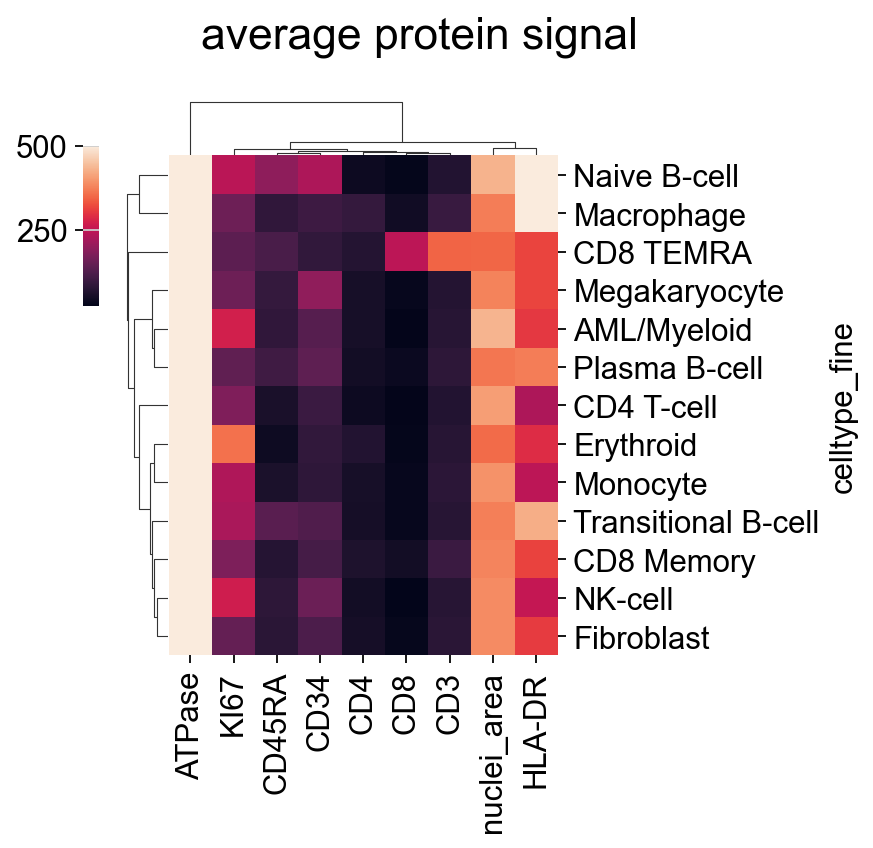

In [11]:
g = sns.clustermap(prot_df, vmax = 500,figsize=[5, 5], dendrogram_ratio=0.1, cbar_pos=(-0.01, 0.7, 0.02, 0.2), cbar_kws={'ticklocation':'left'})
plt.title("average protein signal", fontsize=20, pad=30, x=21, y=1.2)
heatmap_ax = g.ax_heatmap
# Remove the gridlines by setting the grid color to white
heatmap_ax.grid(False)
# g.savefig( "./figures/protein_heatmap.pdf")



same plot without column normalization

In [8]:
# prot_df = pl.from_pandas(adata.obs).select('transferred_ctype', 'nuclei_area', cs.contains('intensity'))
# prot_df = prot_df.group_by('transferred_ctype').agg([pl.mean('nuclei_area'), pl.mean(list(adata.obsm['protein_mean'].columns))]).to_pandas()
# prot_df = prot_df.set_index('transferred_ctype')
# prot_df.columns = prot_df.columns.str.replace('_intensity_mean', '')

# #prot_df = prot_df.drop(columns=['GZMB', 'CD20', 'TIGIT', 'PanCK', 'ATPase'])
# prot_df = prot_df.drop(columns=['GZMB', 'CD20', 'TIGIT', 'PanCK'])

# g = sns.clustermap(prot_df, figsize=[5, 5], dendrogram_ratio=0.1, cbar_pos=(-0.01, 0.7, 0.02, 0.2), cbar_kws={'ticklocation':'left'})
# plt.title("average protein signal non-normalized", fontsize=20, pad=30, x=21, y=1.2)
# heatmap_ax = g.ax_heatmap
# # Remove the gridlines by setting the grid color to white
# heatmap_ax.grid(False)

### plot transcript levels of celltype markers and genes of interest

In [481]:
# df = pd.DataFrame(adata.X.todense(), index = adata.obs.index, columns = adata.var.index)
# df['celltype'] = adata.obs['transferred_ctype']

In [482]:
# df_sub = df[df['celltype']=='AML/Myeloid']
# df_sub = df_sub[df_sub['CD34']>0]
# plt.figure()
# plt.hist(df_sub['CD34'], bins = 100)
# plt.show()

In [483]:
# df_sub = df[df['celltype']=='AML/Myeloid']
# df_sub2 = df_sub[df_sub['CD34']>0]

# df_sub['cd34_high'] = 'low'
# df_sub.loc[df_sub2.index,'cd34_high'] = 'high'

In [37]:
# df_sub.to_csv('dg_cd34.csv')

In [12]:
df = pd.DataFrame(adata.X.todense(), index = adata.obs.index, columns = adata.var.index)
df['celltype'] = adata.obs['transferred_ctype']
df_sub = df[df['celltype']=='AML/Myeloid']
df_sub2 = df_sub[df_sub['CD34']>0]

cd34 = adata.obs.loc[df_sub2.index]

In [13]:
adata.obs['transferred_ctype'] = adata.obs['transferred_ctype'].astype(str)
adata.obs.loc[cd34.index,'transferred_ctype'] = "AML/Myeloid-cd34+"
adata.obs['transferred_ctype'] = adata.obs['transferred_ctype'].astype('category')


adata.obs['celltype_fine'] = adata.obs['celltype_fine'].astype(str)
adata.obs.loc[cd34.index,'celltype_fine'] = "AML/Myeloid-cd34+"
adata.obs['celltype_fine'] = adata.obs['celltype_fine'].astype('category')

{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

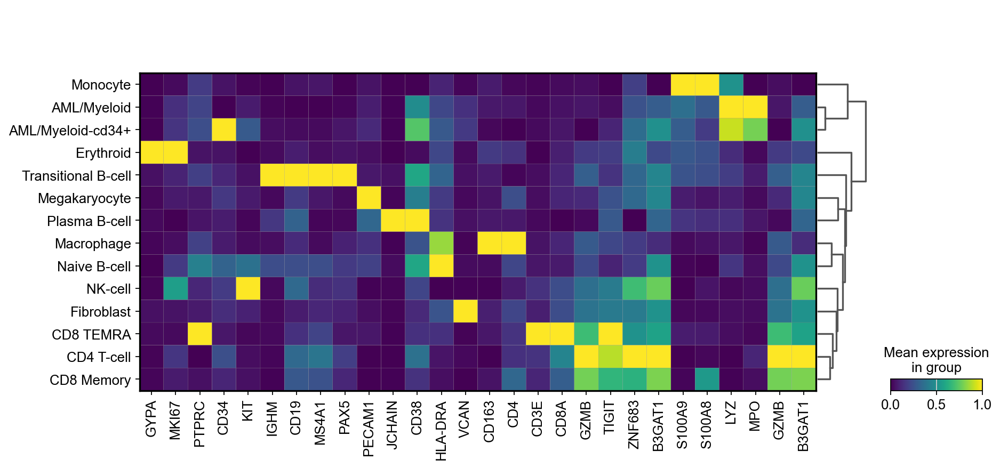

In [14]:
goi = [
    "GYPA",
    "MKI67",
    "PTPRC", # CD45RA
    "CD34",
    "KIT", # CD117
    "IGHM",
    "CD19",
    "MS4A1", # CD20
    "PAX5",
    "PECAM1",
    "JCHAIN",
    "CD38",
    "HLA-DRA",
    "VCAN",
    "CD163",
    "CD4",
    "CD3E",
    "CD8A",
    "GZMB",
    "TIGIT",
    "ZNF683",
    "B3GAT1",
    "S100A9",
    "S100A8",
    "LYZ",
    "MPO",
    "GZMB",
    "B3GAT1",
    # ""
]

sc.tl.dendrogram(adata, groupby='transferred_ctype')

sc.pl.matrixplot(
    adata,
    var_names=goi,
    groupby="celltype_fine",
    standard_scale="var",
    dendrogram=True,
    show=False,
    # save = "rna_heatmap.pdf"
)


same plot without column normalization

{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

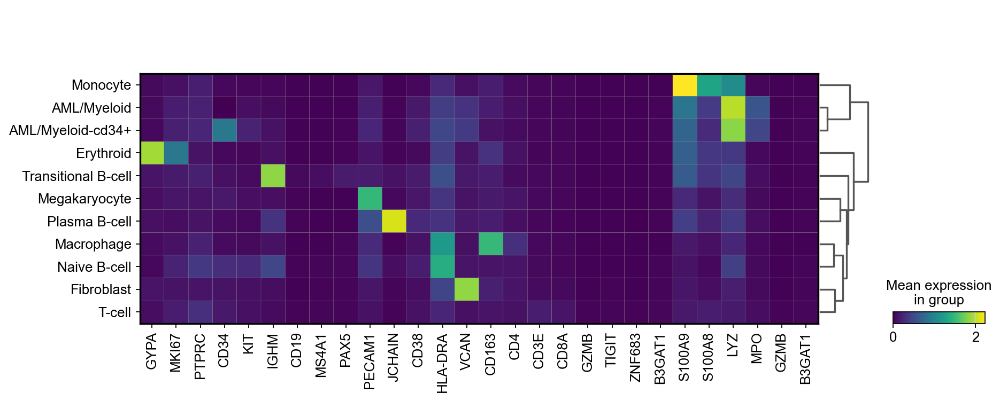

In [15]:
sc.pl.matrixplot(
    adata,
    var_names=goi,
    groupby="transferred_ctype",
    #standard_scale="var",
    dendrogram=True,
    show=False,
)

### spatial overview of sample composition
(same as in 3.TAP1_spatial_metrics)

/opt/anaconda3/lib/python3.11/site-packages/plotnine/ggplot.py:606: PlotnineWarning: Saving 15 x 9 in image.
/opt/anaconda3/lib/python3.11/site-packages/plotnine/ggplot.py:607: PlotnineWarning: Filename: figures/samples_celltypes.pdf


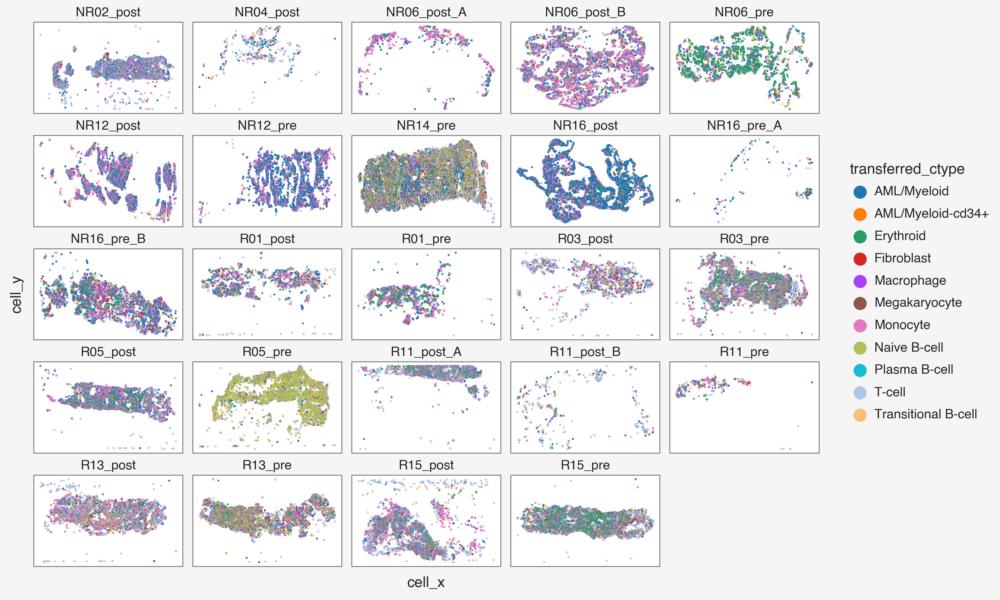

In [17]:
g = (
    ggplot(adata.obs, aes(x="cell_x", y="cell_y", color="transferred_ctype"))
    + pn.geom_point(size = 0.2)
    + pn.facet_wrap("sample_id", scales="free")
    + pn.coord_fixed()
    + pn.scale_color_manual(values=sc.pl.palettes.default_20)
    + pn.guides(colour = pn.guide_legend(override_aes = {'size':7}))
    + sy.style
    + pn.theme(
        figure_size=[15, 9],
        axis_text=pn.element_blank(),
        axis_ticks=pn.element_blank(),
    )


   
)


# g = ggplot(adata.obs, aes(x="cell_x", y="cell_y", color="transferred_ctype"))

ggplot.save( g,
    filename="samples_celltypes.pdf",
    format=None,
    path="./figures/",
    width=None,
    height=None,
    units="in",
    dpi=None,
    limitsize=True,
    verbose=True,
)


(
    ggplot(adata.obs, aes(x="cell_x", y="cell_y", color="transferred_ctype"))
    + pn.geom_point(size = 0.2)
    + pn.facet_wrap("sample_id", scales="free")
    + pn.coord_fixed()
    + pn.scale_color_manual(values=sc.pl.palettes.default_20)
    + pn.guides(colour = pn.guide_legend(override_aes = {'size':7}))
    + sy.style
    + pn.theme(
        figure_size=[15, 9],
        axis_text=pn.element_blank(),
        axis_ticks=pn.element_blank(),
    )


   
)

### samples with very sparse tissue will be excluded from spatial analysis from here on

In [16]:
sparse_samples = ['NR04_post', 'NR06_post_A', 'NR16_pre_A', 'R11_pre', 'R11_post_B']
included_samples = list(set(adata.obs['sample_id'].unique()) - set(sparse_samples))

### Plot celltype distribution on single sample

/opt/anaconda3/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 1169 rows containing missing values.


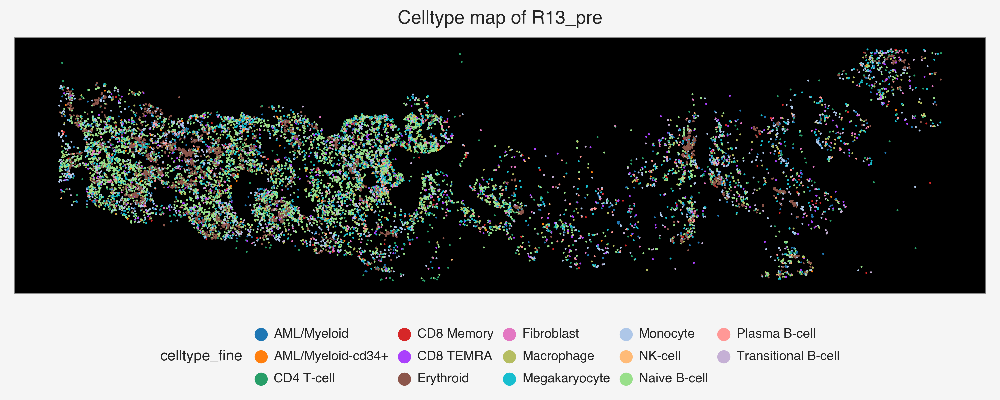

In [27]:
sample_id = 'R13_pre'
sample_df = pl.from_pandas(adata.obs).filter(sample_id=sample_id)

x_lims, y_lims = tap1_auxfns.crop_area(
    sample_df=sample_df, 
    crop_left=0.1, 
    crop_right=0.1, 
    crop_top=0.2, 
    crop_bottom=0.3
    )

(
    ggplot(sample_df, aes(x="cell_x", y="cell_y", color="celltype_fine"))
    + pn.geom_point(size = 0.2)
    + pn.coord_fixed()
    + pn.scale_color_manual(values=sc.pl.palettes.default_20)
    + pn.guides(colour = pn.guide_legend(override_aes = {'size':7}))
    + sy.style
    + pn.ylim(y_lims)
    + pn.xlim(x_lims)
    + pn.ggtitle(f'Celltype map of {sample_id}')
    + pn.theme(legend_position='bottom',
        figure_size=[15, 6],
        axis_title=pn.element_blank(),
        axis_text=pn.element_blank(),
        axis_ticks=pn.element_blank(),
        panel_background=pn.element_rect(fill='black', color='black')
    )
)


### calculate celltype proportions on sample level

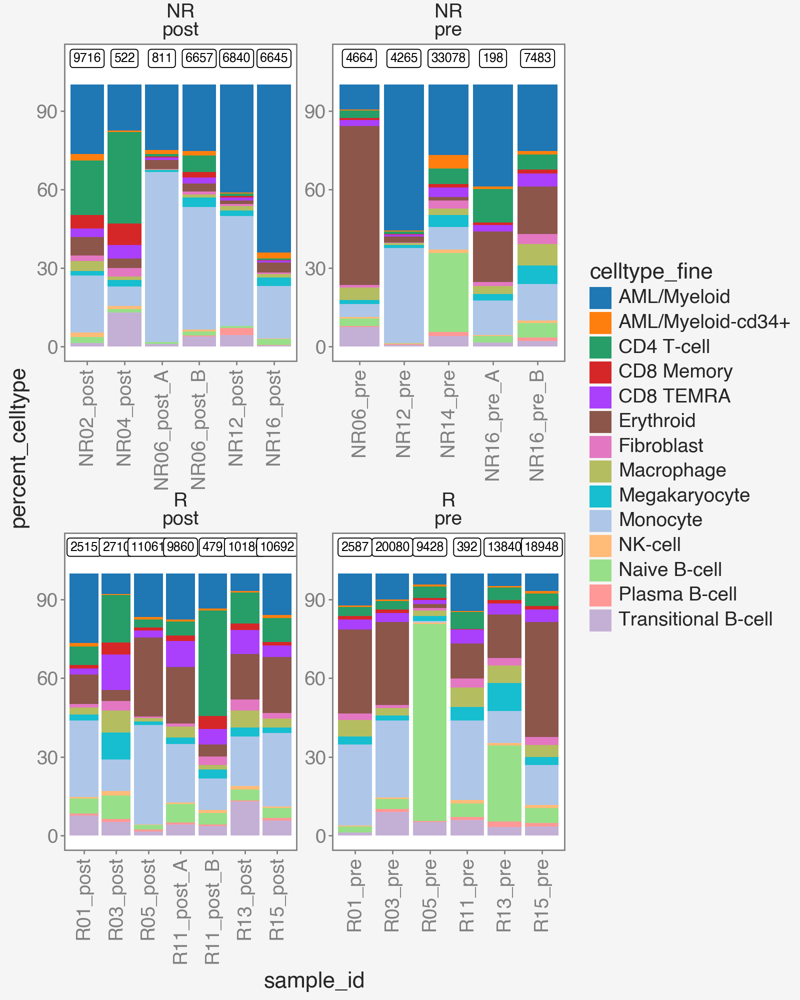

In [28]:
annotation = 'celltype_fine'
ctype_sizes = tap1_auxfns.calculate_proportions(adata=adata, annotation=annotation)

# ctype_sizes.write_csv(f'{output_path}/plot_resources/sample_level_celltype_proportions.csv')

smp_size_df = ctype_sizes.select("sample_id", "group", "timepoint", "sample_size").unique()

# g = (
#     ggplot(ctype_sizes, aes(x="sample_id", y="percent_celltype", fill=annotation))
#     + pn.geom_col()
#     + pn.geom_label(aes(label="sample_size", y=110), data=smp_size_df, fill="white", size=9)
#     + pn.scale_fill_manual(values=sc.pl.palettes.default_20)
#     + sy.style
#     + pn.facet_wrap(facets=["group", "timepoint"], scales="free")
#     + pn.theme(figure_size=[8, 10], axis_text_x=pn.element_text(angle=90))
# )


# ggplot.save( g,
#     filename="samples_celltypes_fine_barplot.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )


(
    ggplot(ctype_sizes, aes(x="sample_id", y="percent_celltype", fill=annotation))
    + pn.geom_col()
    + pn.geom_label(aes(label="sample_size", y=110), data=smp_size_df, fill="white", size=9)
    + pn.scale_fill_manual(values=sc.pl.palettes.default_20)
    + sy.style
    + pn.facet_wrap(facets=["group", "timepoint"], scales="free")
    + pn.theme(figure_size=[8, 10], axis_text_x=pn.element_text(angle=90))
)

### building aggregated annotation similar to Fig3

In [29]:
aggregate_annotation = {
    'AML/Myeloid': 'AML/Myeloid',
    'AML/Myeloid-cd34+':'AML/Myeloid-cd34+',
    'CD4 T-cell': 'T-cell',
    'CD8 Memory': 'T-cell',
    'CD8 TEMRA': 'T-cell',
    'Erythroid': 'Erythroid',
    'Fibroblast': 'Other',
    'Macrophage': 'Myeloid',
    'Megakaryocyte': 'Other',
    'Monocyte': 'Myeloid',
    # 'Myeloid': 'Myeloid',
    'NK-cell': 'NK-cell',
    'Naive B-cell': 'B-cell',
    'Plasma B-cell': 'B-cell',
    'Transitional B-cell': 'B-cell',
    }

adata.obs['celltype_agg'] = adata.obs['celltype_fine'].map(aggregate_annotation)

In [30]:
adata.obs[adata.obs['cell_id'].str.contains('R13_post')]


,nuclei_area,cell_x,cell_y,nuclei_expanded_area,expanded_cell_x,expanded_cell_y,CD8_intensity_mean,HLA-DR_intensity_mean,CD4_intensity_mean,CD3_intensity_mean,...,Classical Monocyte_score,AML-enriched_score,Non-Classical Monocyte_score,CML-enriched_score,Plasma B Cell_score,Transitional B Cell_score,transferred_ctype,cell_id,celltype_fine,celltype_agg
86828,501.0,588.834331,13286.840319,2296.0,588.802700,13286.891115,0.360627,0.015679,0.722125,2.021777,...,-0.027374,-0.064733,-0.141474,-0.008404,-0.073974,0.184421,T-cell,R13_post_86828,CD4 T-cell,T-cell
86830,270.0,730.807407,13190.748148,1322.0,726.993949,13188.366868,0.195159,0.249622,0.161120,8.940242,...,0.023321,0.097275,0.004749,-0.047919,0.064931,0.020932,T-cell,R13_post_86830,CD4 T-cell,T-cell
86832,141.0,789.709220,13850.815603,1341.0,789.764355,13850.749441,77.099925,115.150634,57.160328,46.689784,...,-0.026050,0.132488,0.057933,-0.057092,0.065873,-0.052708,T-cell,R13_post_86832,CD4 T-cell,T-cell
86834,161.0,1007.155280,13543.602484,1406.0,1007.163585,13543.659317,3.213371,14.487909,3.133713,7.904694,...,0.076342,0.109152,-0.019086,-0.110655,-0.139917,-0.163667,Macrophage,R13_post_86834,Macrophage,Myeloid
86835,693.0,1019.782107,13359.330447,2243.0,1023.862684,13357.942488,1.188587,1.429782,1.374944,10.958092,...,-0.123605,-0.076105,-0.032432,-0.052313,-0.044719,-0.076753,T-cell,R13_post_86835,CD4 T-cell,T-cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106692,447.0,20417.250559,8049.342282,2117.0,20417.185168,8049.381672,0.195915,3.295352,17.462543,5.285025,...,0.364452,-0.032368,-0.020269,-0.079900,-0.080787,-0.155041,AML/Myeloid,R13_post_106692,AML/Myeloid,AML/Myeloid
106693,705.0,20463.890780,7792.669504,2443.0,20459.624642,7792.575113,0.298340,2.317568,3.717860,30.854198,...,-0.072913,0.118059,0.010421,-0.090858,0.023247,0.010421,T-cell,R13_post_106693,CD4 T-cell,T-cell
106694,333.0,20472.054054,8075.798799,1873.0,20472.161773,8075.940203,0.461980,0.188818,11.503076,10.085680,...,0.216010,-0.044719,-0.103240,-0.125744,0.032922,-0.087969,Monocyte,R13_post_106694,Monocyte,Myeloid
106697,442.0,20969.009050,14226.090498,2118.0,20968.912653,14226.067044,0.279981,0.017469,2.556657,8.423985,...,0.063921,0.037179,0.065462,-0.018790,-0.123476,0.116372,Fibroblast,R13_post_106697,Fibroblast,Other


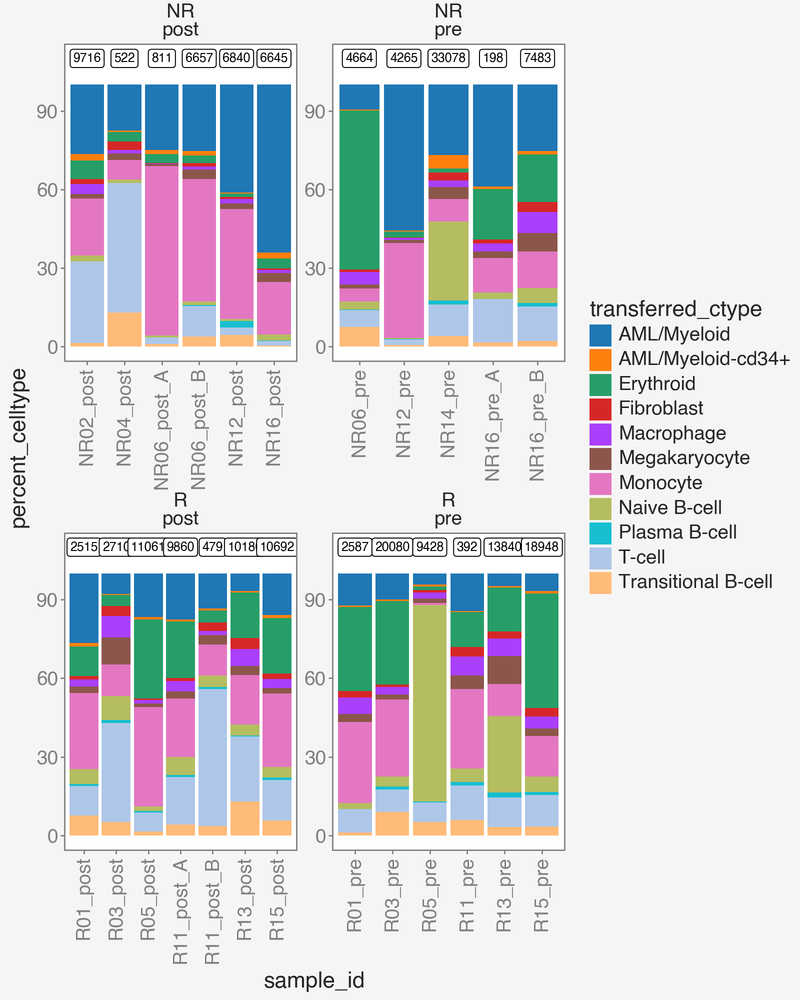

In [31]:
# annotation = 'celltype_agg'
ANN = 'transferred_ctype'

annotation = ANN
ctype_sizes = tap1_auxfns.calculate_proportions(adata=adata, annotation=annotation)

ctype_sizes.write_csv(f'{output_path}/plot_resources/sample_level_celltype_proportions_aggregated.csv')

smp_size_df = ctype_sizes.select("sample_id", "group", "timepoint", "sample_size").unique()

# g = (
#     ggplot(
#         ctype_sizes, aes(x="sample_id", y="percent_celltype", fill=annotation)
#     )
#     + pn.geom_col()
#     + pn.geom_label(
#         aes(label="sample_size", y=110), data=smp_size_df, fill="white", size=9
#     )
#     + pn.scale_fill_manual(values=sc.pl.palettes.default_20)
#     + sy.style
#     + pn.facet_wrap(facets=["group", "timepoint"], scales="free")
#     + pn.theme(figure_size=[8, 10], axis_text_x=pn.element_text(angle=90))
# )



# ggplot.save( g,
#     filename="barplot_transferred_ctype_bysample.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )


(
    ggplot(
        ctype_sizes, aes(x="sample_id", y="percent_celltype", fill=annotation)
    )
    + pn.geom_col()
    + pn.geom_label(
        aes(label="sample_size", y=110), data=smp_size_df, fill="white", size=9
    )
    + pn.scale_fill_manual(values=sc.pl.palettes.default_20)
    + sy.style
    + pn.facet_wrap(facets=["group", "timepoint"], scales="free")
    + pn.theme(figure_size=[8, 10], axis_text_x=pn.element_text(angle=90))
)


### calculate celltype fractions per treatment group

In [32]:
ANN = 'celltype_fine'

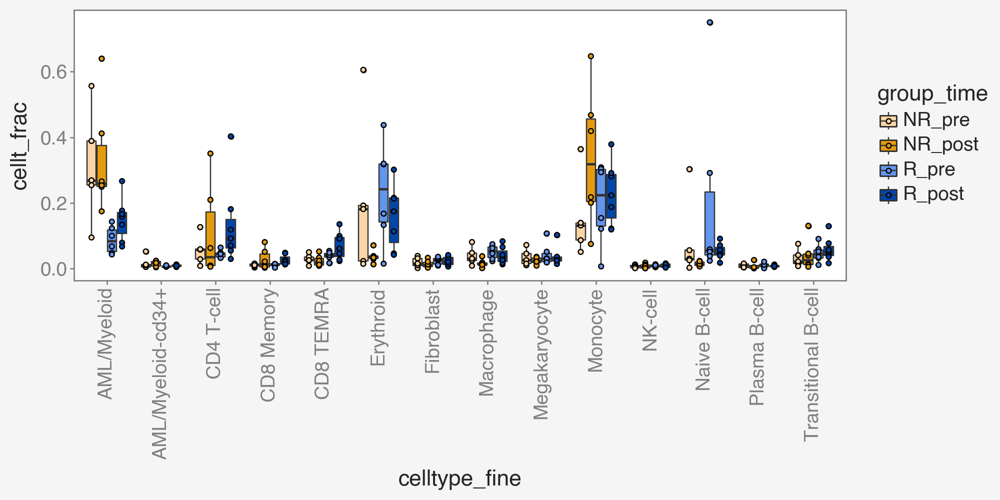

In [33]:
celltype_frac = tap1_auxfns.calculate_celltype_fraction(adata, annotation=ANN)

group_order = pl.Enum(['NR_pre', 'NR_post', 'R_pre', 'R_post'])
celltype_frac = celltype_frac.with_columns(pl.col('group_time').cast(dtype=group_order))
cols = ['#FAD5A5', '#E49B0F', '#6495ED', '#0047AB']

radius = 100

# celltype_frac.write_csv(f'{output_path}/plot_resources/treatment_group_celltype_fractions.csv')

# g = (
#     ggplot(celltype_frac, aes(x=ANN, y="cellt_frac", fill="group_time"))
#     + pn.geom_boxplot()
#     + pn.geom_point(position=pn.position_dodge(width=0.75))
#     + pn.scale_fill_manual(values=cols)
#     + sy.style
#     + pn.theme(figure_size=[10, 5], axis_text_x=pn.element_text(angle=90))
# )



# ggplot.save( g,
#     filename="celltype_frac_boxplot.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )

(
    ggplot(celltype_frac, aes(x=ANN, y="cellt_frac", fill="group_time"))
    + pn.geom_boxplot()
    + pn.geom_point(position=pn.position_dodge(width=0.75))
    + pn.scale_fill_manual(values=cols)
    + sy.style
    + pn.theme(figure_size=[10, 5], axis_text_x=pn.element_text(angle=90))
)

In [34]:
fc = pd.DataFrame(columns = celltype_frac.columns)
for col in celltype_frac.columns:
    fc[col] = celltype_frac[col]
fc

,sample_id,patient,group,timepoint,celltype_fine,celltype_size,sample_size,cellt_frac,group_time
0,NR02_post,NR02,NR,post,Monocyte,2112,9716,0.217373,NR_post
1,R15_pre,R15,R,pre,Monocyte,2918,18948,0.154000,R_pre
2,NR02_post,NR02,NR,post,Plasma B-cell,4,9716,0.000412,NR_post
3,R11_pre,R11,R,pre,CD8 TEMRA,21,392,0.053571,R_pre
4,R01_post,R01,R,post,NK-cell,15,2515,0.005964,R_post
...,...,...,...,...,...,...,...,...,...
328,NR12_post,NR12,NR,post,Transitional B-cell,311,6840,0.045468,NR_post
329,NR06_pre,NR06,NR,pre,Monocyte,236,4664,0.050600,NR_pre
330,R05_post,R05,R,post,AML/Myeloid,1837,11061,0.166079,R_post
331,R03_pre,R03,R,pre,Macrophage,579,20080,0.028835,R_pre


In [35]:
# temra = fc[fc['celltype_fine']=='CD8 TEMRA']
# sns.boxplot(data = temra, x = 'group_time', y = 'cellt_frac')

In [36]:
from scipy.stats import mannwhitneyu, wilcoxon
for celltype in np.unique(fc['celltype_fine']):
    d = fc[fc['celltype_fine']==celltype]
    d = d[d['patient']!='R11']
    # d = d[d['sample_id']!='NR06_post_B']
    d_r = d[d['group']=='R']
    d_nr = d[d['group']=='NR']
    d_pre = d_r[d_r['timepoint']=='post']
    d_post = d_nr[d_nr['timepoint']=='post']
    # if celltype == 'CD8 TEMRA':
    #     print(d_pre['cellt_frac'],d_post['cellt_frac'])
    #     break
    s,p = mannwhitneyu(d_pre['cellt_frac'],d_post['cellt_frac'])
    print(celltype,p)

AML/Myeloid 0.05194805194805195
AML/Myeloid-cd34+ 0.24675324675324672
CD4 T-cell 0.5367965367965368
CD8 Memory 0.7922077922077921
CD8 TEMRA 0.12554112554112554
Erythroid 0.008658008658008658
Fibroblast 0.32900432900432897
Macrophage 0.08225108225108226
Megakaryocyte 0.6623376623376623
Monocyte 0.5367965367965368
NK-cell 0.5367965367965368
Naive B-cell 0.017316017316017316
Plasma B-cell 0.2857142857142857
Transitional B-cell 0.17748917748917747


### convert fractions to paired fold changes

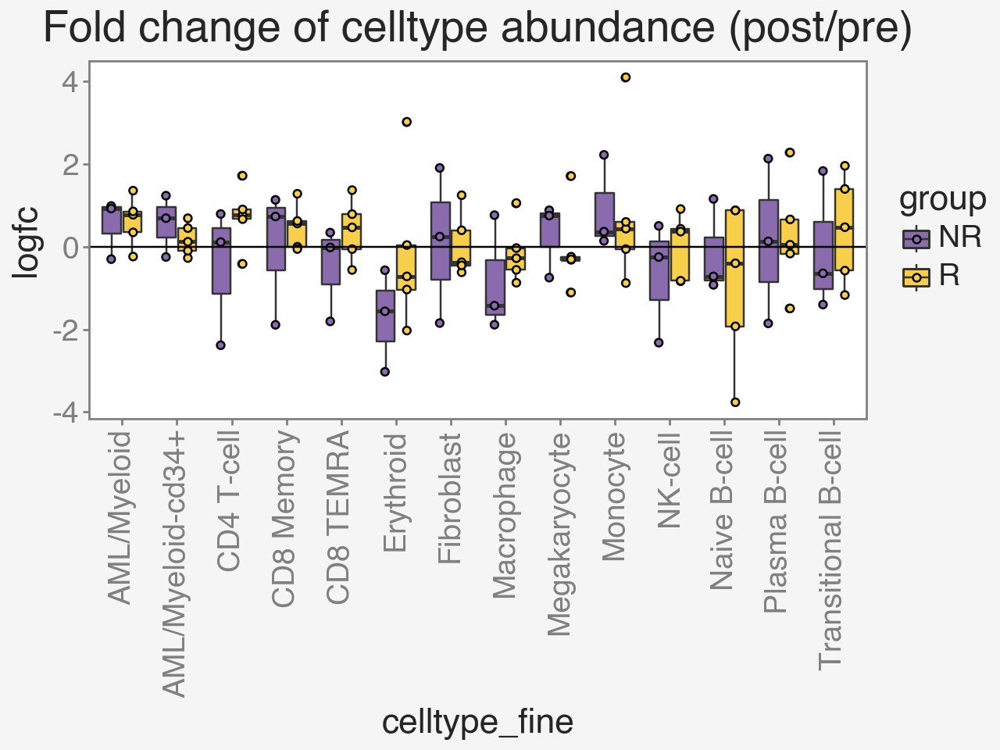

In [37]:
fc_df = (
    celltype_frac.filter(~pl.col('sample_id').is_in(sparse_samples))
    .pivot(on='timepoint', values='cellt_frac', index=['patient', 'group', 'celltype_fine'])
    .sort('patient', 'celltype_fine')
    .filter(pl.col('pre').is_not_null(), pl.col('post').is_not_null())
    .with_columns((pl.col('post') / pl.col('pre')).log().alias('logfc'))
    )

fc_df.write_csv(f'{output_path}/plot_resources/celltype_fractions_as_paired_fold_changes.csv')

# g=(
#     ggplot(fc_df, aes(x='celltype_fine', y='logfc', fill='group'))
#     + pn.geom_boxplot()
#     + pn.geom_point(position = pn.position_dodge(width=0.8))
#     + pn.scale_fill_manual(values=sy.mode20b)
#     + pn.geom_hline(yintercept=0)
#     + pn.ggtitle('Fold change of celltype abundance (post/pre)')
#     + sy.style
#     + pn.theme(axis_text_x=pn.element_text(angle=90))
# )



# ggplot.save( g,
#     filename="foldchange_abundance.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )

(
    ggplot(fc_df, aes(x='celltype_fine', y='logfc', fill='group'))
    + pn.geom_boxplot()
    + pn.geom_point(position = pn.position_dodge(width=0.8))
    + pn.scale_fill_manual(values=sy.mode20b)
    + pn.geom_hline(yintercept=0)
    + pn.ggtitle('Fold change of celltype abundance (post/pre)')
    + sy.style
    + pn.theme(axis_text_x=pn.element_text(angle=90))
)

In [38]:
fc = pd.DataFrame(columns = ['patient', 'group', 'celltype_fine', 'pre', 'post', 'logfc'])
for col in fc_df.columns:
    fc[col] = fc_df[col]
# fc

In [39]:
from scipy.stats import ttest_ind
for celltype in np.unique(fc['celltype_fine']):
    d = fc[fc['celltype_fine']==celltype]
    d_r = d[d['group']=='R']
    d_nr = d[d['group']=='NR']
    s,p = ttest_ind(d_r['logfc'],d_nr['logfc'])
    print(celltype,p)


AML/Myeloid 0.8662980495991655
AML/Myeloid-cd34+ 0.3701497648190151
CD4 T-cell 0.19564403933912006
CD8 Memory 0.5449725487934591
CD8 TEMRA 0.22291789686543242
Erythroid 0.2569212533360041
Fibroblast 0.9485427902835308
Macrophage 0.3735459802598564
Megakaryocyte 0.6514441509034561
Monocyte 0.9571667653129781
NK-cell 0.40339664828846733
Naive B-cell 0.601869111060551
Plasma B-cell 0.9152424019955983
Transitional B-cell 0.6614793100335532


In [40]:
for celltype in np.unique(fc['celltype_fine']):
    d = fc[fc['celltype_fine']==celltype]
    d_r = d[d['group']=='R']
    s,p = ttest_ind(d_r['pre'],d_r['post'])
    print(celltype,p)

AML/Myeloid 0.10580768162725825
AML/Myeloid-cd34+ 0.31415313238430764
CD4 T-cell 0.05580360523568964
CD8 Memory 0.1731438027825099
CD8 TEMRA 0.23951233028166324
Erythroid 0.36155200482112126
Fibroblast 0.7398032994509437
Macrophage 0.9549713866317279
Megakaryocyte 0.9499612094775023
Monocyte 0.3254581095392483
NK-cell 0.663908126102965
Naive B-cell 0.22457071821908972
Plasma B-cell 0.7116726736298022
Transitional B-cell 0.36814936193989434


# Spatial analysis

read annotated connectivity graph and averaged neighborhood proportions

In [41]:
dists = pl.read_csv(f'{output_path}/spatial_metrics/connectivity_graphs/connectivities_rad1500.csv')
mean_neighbors = pl.read_csv(f'{output_path}/spatial_metrics/neighborhoods_sample_level/neighborhoods_avergaged_ranges_0to1500.csv') 

In [34]:
# aml_myeloid = dists[dists['qry_celltype'].isin(['AML','Myeloid'])

plot neighborhood of a single cell. Sorry this function is experimental and often errors out because there is somehting wrong with the way the circle is drawn

/opt/anaconda3/lib/python3.11/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 13813 rows containing missing values.


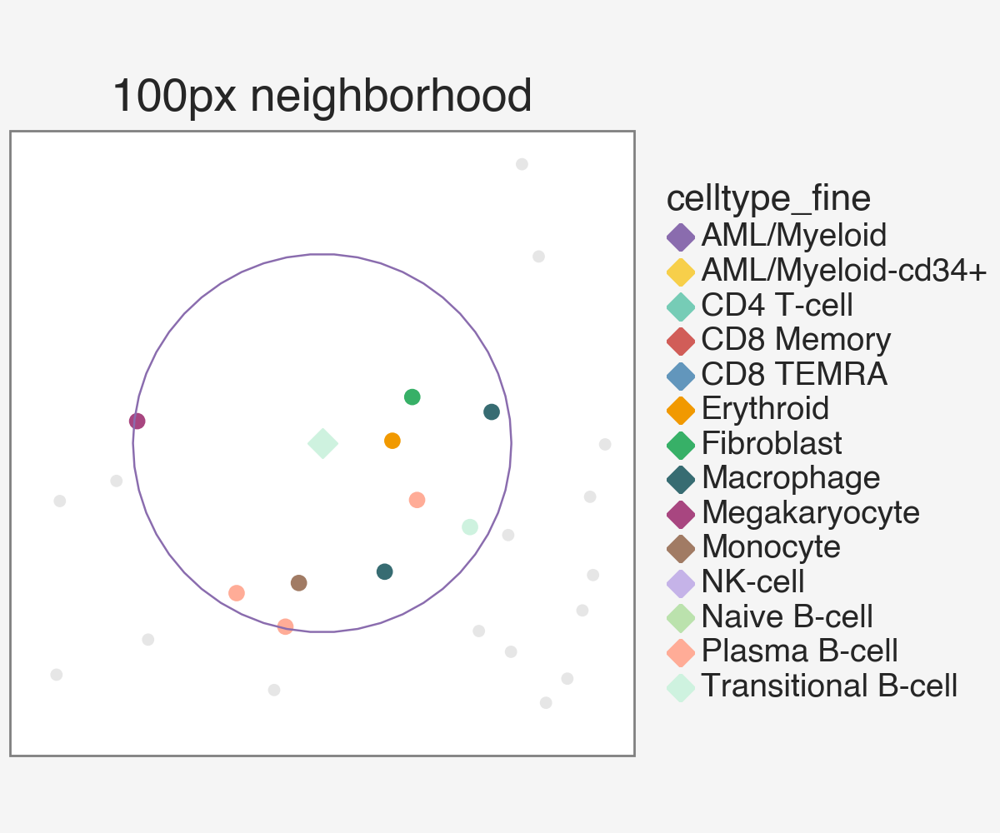

In [42]:
sample_id = 'R13_pre'

# select any reandom cell from sample
# cells = pl.from_pandas(adata.obs).filter(sample_id=sample_id)['cell_id']
# rnd_cell = random.choice(list(cells))
rnd_cell = 'R13_pre_112083'

sample_id = rnd_cell.split('_', 2)[0] + "_" + rnd_cell.split('_', 2)[1]
sample_id

p, cell_id = tap1_auxfns.plot_neighborhood(adata=adata, distances=dists, sample_id=sample_id, cell_id=rnd_cell, radius=100)
p

### sample level neighborhood proportions for one query cell type versus all other cell types

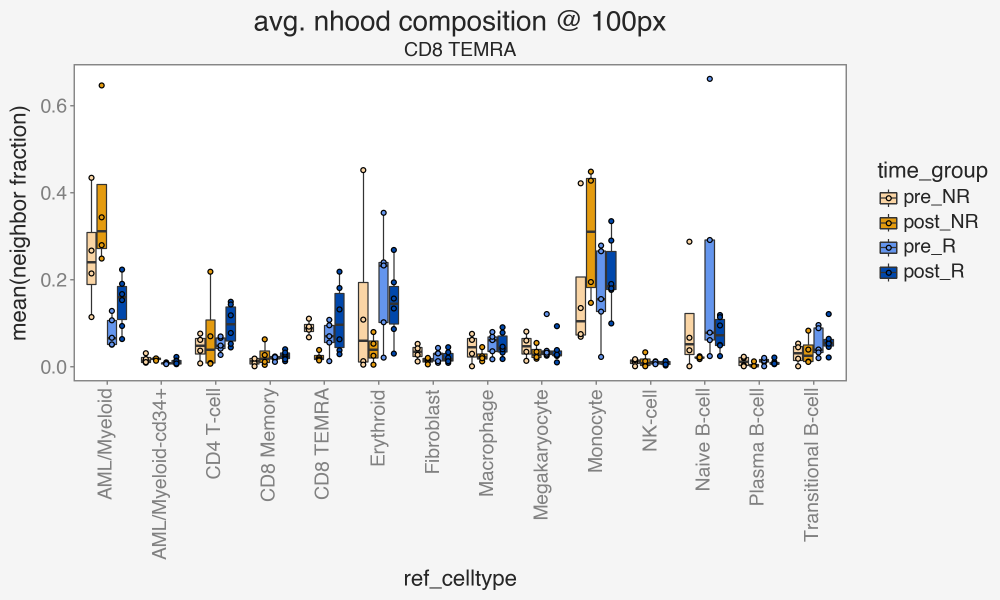

In [43]:
group_order = pl.Enum(['pre_NR', 'post_NR', 'pre_R', 'post_R'])
mean_neighbors = mean_neighbors.with_columns(pl.col('time_group').cast(dtype=group_order))

radius = 100
cols = ['#FAD5A5', '#E49B0F', '#6495ED', '#0047AB']

query_celltypes = ['CD8 TEMRA']

plot_data = mean_neighbors.filter(
    pl.col("radius") == radius,
    pl.col("qry_celltype").is_in(query_celltypes)
)

# g=(
#     ggplot(plot_data, aes(x='ref_celltype', y='obs_frac', fill='time_group'))
#     + pn.geom_boxplot(outlier_alpha=0.25, outlier_size=0.5)
#     + pn.geom_point(position=pn.position_dodge(width=0.75))
#     + pn.scale_fill_manual(values=cols)
#     + pn.ylab('mean(neighbor fraction)')
#     + pn.facet_wrap(facets='qry_celltype', nrow=1)
#     + pn.ggtitle(f'avg. nhood composition @ {radius}px')
#     + sy.style
#     + pn.theme(figure_size=[10, 6], axis_text_x=pn.element_text(angle=90))

# )

# ggplot.save( g,
#     filename="neighborhood_comp_100px.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )

(
    ggplot(plot_data, aes(x='ref_celltype', y='obs_frac', fill='time_group'))
    + pn.geom_boxplot(outlier_alpha=0.25, outlier_size=0.5)
    + pn.geom_point(position=pn.position_dodge(width=0.75))
    + pn.scale_fill_manual(values=cols)
    + pn.ylab('mean(neighbor fraction)')
    + pn.facet_wrap(facets='qry_celltype', nrow=1)
    + pn.ggtitle(f'avg. nhood composition @ {radius}px')
    + sy.style
    + pn.theme(figure_size=[10, 6], axis_text_x=pn.element_text(angle=90))

)

In [37]:
## add diversity by niches

similarly, we can plot one query celltype against specific reference celltypes. Here CD8 TEMRA or AML vs CD8 TEMRAs, showing decreased CD8 self-association in NR-post and decreased AML-CD8 association in NR vs R

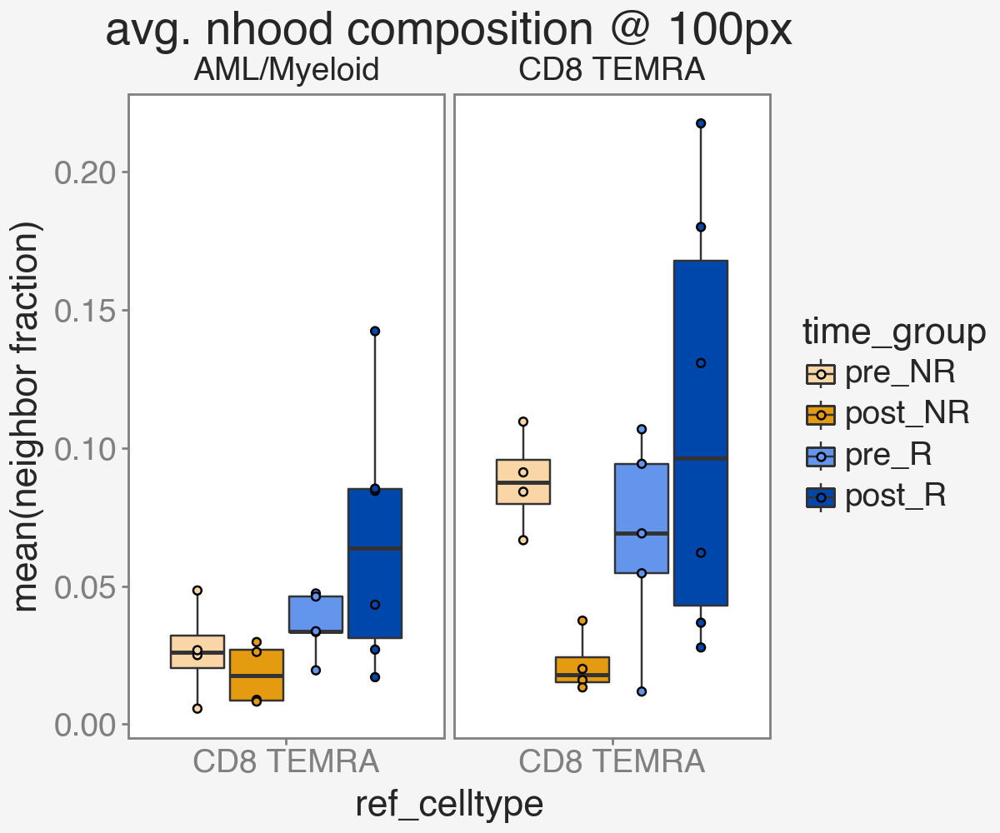

In [44]:
query_celltypes = ['CD8 TEMRA', 'AML/Myeloid']
ref_celltypes = ['CD8 TEMRA']

plot_data = mean_neighbors.filter(
    pl.col("radius") == radius,
    pl.col("qry_celltype").is_in(query_celltypes),
    pl.col('ref_celltype').is_in(ref_celltypes)
)

# g = (
#     ggplot(plot_data, aes(x='ref_celltype', y='obs_frac', fill='time_group'))
#     + pn.geom_boxplot(outlier_alpha=0.25, outlier_size=0.5)
#     + pn.geom_point(position=pn.position_dodge(width=0.75))
#     + pn.scale_fill_manual(values=cols)
#     + pn.ylab('mean(neighbor fraction)')
#     + pn.facet_wrap(facets='qry_celltype', nrow=1)
#     + pn.ggtitle(f'avg. nhood composition @ {radius}px')
#     + sy.style
#     + pn.theme(figure_size=[6, 5], axis_text_x=pn.element_text(angle=0))
# )



# ggplot.save( g,
#     filename="neigborhood_comp_justAMLandTEMRA.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )

(
    ggplot(plot_data, aes(x='ref_celltype', y='obs_frac', fill='time_group'))
    + pn.geom_boxplot(outlier_alpha=0.25, outlier_size=0.5)
    + pn.geom_point(position=pn.position_dodge(width=0.75))
    + pn.scale_fill_manual(values=cols)
    + pn.ylab('mean(neighbor fraction)')
    + pn.facet_wrap(facets='qry_celltype', nrow=1)
    + pn.ggtitle(f'avg. nhood composition @ {radius}px')
    + sy.style
    + pn.theme(figure_size=[6, 5], axis_text_x=pn.element_text(angle=0))
)


when plotting CD8 self association as a function of neighborhood radius, we see that the difference between baseline (1500 px) and smaller neighborhoods is smallest in NR_post

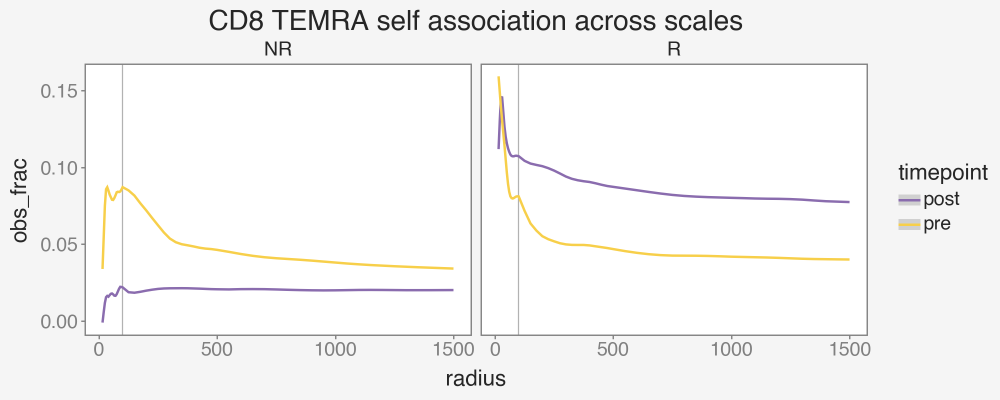

In [45]:
import warnings
#from plotnine import PlotnineWarning
warnings.filterwarnings("ignore")

ref_types = ['AML/Myeloid', 'CD4 T-cell', 'CD8 Memory', 'CD8 TEMRA', 'Erythroid', 'Monocyte', 'Myeloid', 'NK-cell']
ref_types = ['CD8 TEMRA']
qry_types = ['CD8 TEMRA']

# g = (
#     ggplot(mean_neighbors.filter(pl.col('ref_celltype').is_in(ref_types), qry_celltype=qry_types[0]), aes(x='radius', y='obs_frac', color='timepoint'))
#     #+ pn.geom_point()
#     + pn.geom_vline(xintercept=100, color='0.7')
#     + pn.scale_color_manual(values=sy.mode20b)
#     + pn.geom_smooth(method='lowess', span=0.1)
#     + pn.facet_wrap('group')
#     + pn.ggtitle('CD8 TEMRA self association across scales')
#     + sy.style
#     + pn.theme(figure_size=[10,4])
# )




# ggplot.save( g,
#     filename="self_association_across_scales_temra.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )


(
    ggplot(mean_neighbors.filter(pl.col('ref_celltype').is_in(ref_types), qry_celltype=qry_types[0]), aes(x='radius', y='obs_frac', color='timepoint'))
    #+ pn.geom_point()
    + pn.geom_vline(xintercept=100, color='0.7')
    + pn.scale_color_manual(values=sy.mode20b)
    + pn.geom_smooth(method='lowess', span=0.1)
    + pn.facet_wrap('group')
    + pn.ggtitle('CD8 TEMRA self association across scales')
    + sy.style
    + pn.theme(figure_size=[10,4])
)




# Diversity index

read table generated in step 3

In [46]:
mean_divs = pl.read_csv(f'{output_path}/spatial_metrics/shannon_diversity/shannon_diversity_across_radii.csv')

group_enum = pl.Enum(['pre_NR', 'post_NR', 'pre_R', 'post_R'])
mean_divs = mean_divs.with_columns(pl.col('time_group').cast(dtype=group_enum))
mean_divs

sample_id,patient,timepoint,group,qry_celltype,shann_div,radius,time_group
str,str,str,str,str,f64,i64,enum
"""NR14_pre""","""NR14""","""pre""","""NR""","""CD4 T-cell""",-0.0,10,"""pre_NR"""
"""NR14_pre""","""NR14""","""pre""","""NR""","""AML/Myeloid""",-0.0,10,"""pre_NR"""
"""R03_post""","""R03""","""post""","""R""","""Transitional B-cell""",-0.0,10,"""post_R"""
"""R03_post""","""R03""","""post""","""R""","""Monocyte""",-0.0,10,"""post_R"""
"""R03_post""","""R03""","""post""","""R""","""Megakaryocyte""",-0.0,10,"""post_R"""
…,…,…,…,…,…,…,…
"""NR16_post""","""NR16""","""post""","""NR""","""CD4 T-cell""",0.547673,1500,"""post_NR"""
"""R11_post_A""","""R11""","""post""","""R""","""Fibroblast""",0.938632,1500,"""post_R"""
"""NR16_pre_B""","""NR16""","""pre""","""NR""","""Plasma B-cell""",0.952216,1500,"""pre_NR"""


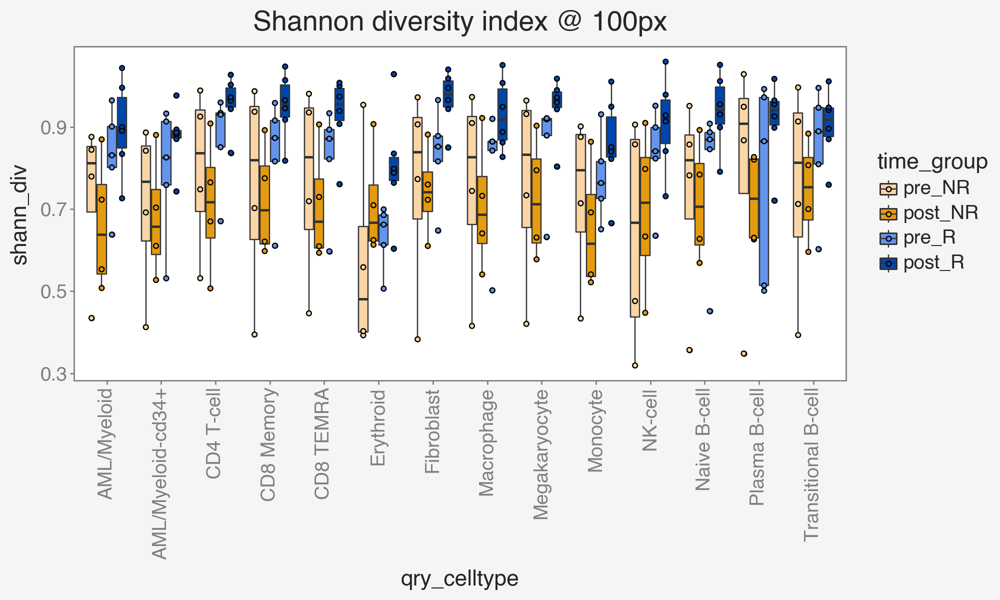

In [47]:
radius = 100

shannon_div = mean_divs.filter(radius=radius)

# g = (
#     ggplot(shannon_div, aes(x='qry_celltype', y='shann_div', fill='time_group'))
#     + pn.geom_boxplot()
#     + pn.scale_fill_manual(values=cols)
#     + pn.geom_point(position=pn.position_dodge(width=0.75))
#     + pn.ggtitle(f'Shannon diversity index @ {radius}px')
#     + sy.style
#     + pn.theme(figure_size=[10,6], axis_text_x=pn.element_text(angle=90))
# )




# ggplot.save( g,
#     filename="shannon_diversity_boxplot_100px.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )


(
    ggplot(shannon_div, aes(x='qry_celltype', y='shann_div', fill='time_group'))
    + pn.geom_boxplot()
    + pn.scale_fill_manual(values=cols)
    + pn.geom_point(position=pn.position_dodge(width=0.75))
    + pn.ggtitle(f'Shannon diversity index @ {radius}px')
    + sy.style
    + pn.theme(figure_size=[10,6], axis_text_x=pn.element_text(angle=90))
)


In [42]:
shannon_div

sample_id,patient,timepoint,group,qry_celltype,shann_div,radius,time_group
str,str,str,str,str,f64,i64,enum
"""R11_post_A""","""R11""","""post""","""R""","""AML/Myeloid-cd34+""",0.893304,100,"""post_R"""
"""R15_post""","""R15""","""post""","""R""","""Naive B-cell""",0.930207,100,"""post_R"""
"""R01_pre""","""R01""","""pre""","""R""","""Naive B-cell""",0.845329,100,"""pre_R"""
"""R05_post""","""R05""","""post""","""R""","""CD4 T-cell""",0.836689,100,"""post_R"""
"""R05_pre""","""R05""","""pre""","""R""","""Plasma B-cell""",0.514145,100,"""pre_R"""
…,…,…,…,…,…,…,…
"""NR16_post""","""NR16""","""post""","""NR""","""CD4 T-cell""",0.506869,100,"""post_NR"""
"""NR12_post""","""NR12""","""post""","""NR""","""Fibroblast""",0.722574,100,"""post_NR"""
"""R05_post""","""R05""","""post""","""R""","""Macrophage""",0.826557,100,"""post_R"""


In [43]:
fc = pd.DataFrame(columns = ['sample_id','patient','timepoint', 'group', 'qry_celltype', 'shann_div', 'radius', 'time_group'])
for col in shannon_div.columns:
    fc[col] = shannon_div[col]
fc

,sample_id,patient,timepoint,group,qry_celltype,shann_div,radius,time_group
0,R11_post_A,R11,post,R,AML/Myeloid-cd34+,0.893304,100,post_R
1,R15_post,R15,post,R,Naive B-cell,0.930207,100,post_R
2,R01_pre,R01,pre,R,Naive B-cell,0.845329,100,pre_R
3,R05_post,R05,post,R,CD4 T-cell,0.836689,100,post_R
4,R05_pre,R05,pre,R,Plasma B-cell,0.514145,100,pre_R
...,...,...,...,...,...,...,...,...
261,NR16_post,NR16,post,NR,CD4 T-cell,0.506869,100,post_NR
262,NR12_post,NR12,post,NR,Fibroblast,0.722574,100,post_NR
263,R05_post,R05,post,R,Macrophage,0.826557,100,post_R
264,R13_post,R13,post,R,Monocyte,0.948953,100,post_R


In [44]:
# fc.to_csv('shannon_div_celltype.csv')

In [45]:
sample_df = pd.DataFrame(adata.obs)
sample_df['sample'] = [cell.split('_')[0] + '_' + cell.split('_')[1] for cell in sample_df['cell_id']]
sample_df

,nuclei_area,cell_x,cell_y,nuclei_expanded_area,expanded_cell_x,expanded_cell_y,CD8_intensity_mean,HLA-DR_intensity_mean,CD4_intensity_mean,CD3_intensity_mean,...,AML-enriched_score,Non-Classical Monocyte_score,CML-enriched_score,Plasma B Cell_score,Transitional B Cell_score,transferred_ctype,cell_id,celltype_fine,celltype_agg,sample
2,901.0,639.789123,687.502775,2771.0,639.447131,683.243233,0.000000,0.005052,0.000000,0.298087,...,-0.147789,-0.114734,0.035730,0.157447,0.031334,Transitional B-cell,R01_post_2,Transitional B-cell,B-cell,R01_post
5,766.0,678.298956,725.821149,2312.0,681.508651,726.881920,0.000000,0.046713,0.000865,0.020761,...,0.079806,0.030543,0.123325,0.033499,0.063217,T-cell,R01_post_5,CD4 T-cell,T-cell,R01_post
10,800.0,713.026250,689.468750,2472.0,716.749191,690.717638,0.000000,0.000000,0.000000,0.005663,...,-0.007823,-0.022047,-0.024126,0.041995,0.077686,T-cell,R01_post_10,CD4 T-cell,T-cell,R01_post
16,204.0,799.470588,521.000000,1539.0,799.380767,520.824561,0.000000,0.000000,0.000000,0.000000,...,0.120911,-0.039875,-0.067712,-0.077177,0.075159,T-cell,R01_post_16,CD4 T-cell,T-cell,R01_post
21,777.0,1031.899614,731.425997,2869.0,1031.707912,731.074590,0.000000,0.135936,0.000697,2.521785,...,-0.059645,-0.064935,0.105521,0.000651,0.087791,T-cell,R01_post_21,CD4 T-cell,T-cell,R01_post
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311741,271.0,33567.405904,5296.354244,1726.0,33567.541715,5296.466976,3.985516,14.527810,4.510429,13.205098,...,-0.055497,-0.080206,-0.097478,-0.105284,-0.128412,AML/Myeloid,NR16_pre_B_311741,AML/Myeloid,AML/Myeloid,NR16_pre
311743,295.0,33674.372881,6301.223729,1770.0,33674.384181,6301.283051,2.071186,108.279661,22.593785,53.181921,...,-0.043678,-0.149524,-0.014570,0.047282,-0.122700,AML/Myeloid,NR16_pre_B_311743,AML/Myeloid,AML/Myeloid,NR16_pre
311746,838.0,33703.125298,6558.894988,2741.0,33702.885078,6557.264137,3.986136,967.432689,7.043780,47.758117,...,-0.089424,0.206357,-0.104166,0.088285,0.026738,AML/Myeloid,NR16_pre_B_311746,AML/Myeloid,AML/Myeloid,NR16_pre
311748,521.0,33713.679463,6601.976967,2213.0,33713.906462,6602.803886,2.799819,236.497515,3.773159,60.916403,...,0.092526,0.087999,-0.051307,-0.127589,0.057257,AML/Myeloid-cd34+,NR16_pre_B_311748,AML/Myeloid-cd34+,AML/Myeloid-cd34+,NR16_pre


In [46]:
from scipy.stats import entropy
entropy_df = pd.DataFrame(index = np.unique(sample_df['sample']), columns = ['shann_entropy'])
for sample in np.unique(sample_df['sample']):
    sub = sample_df[sample_df['sample']==sample]
    a,c = np.unique(sub['celltype_fine'], return_counts = True)
    entropy_df.loc[sample,'shann_entropy'] = entropy(c)
    
entropy_df['time'] = [ cell.split('_')[1] for cell in entropy_df.index]
entropy_df['response'] = 'R'
NR = entropy_df[entropy_df.index.str.contains('NR')]
entropy_df.loc[NR.index,'response'] = 'NR'
entropy_df['response_group'] = [entropy_df.loc[cell,'time'] + '_' + entropy_df.loc[cell,'response'] for cell in entropy_df.index]
    

In [48]:
# entropy_df.to_csv('entropy_df_sample_level.csv')

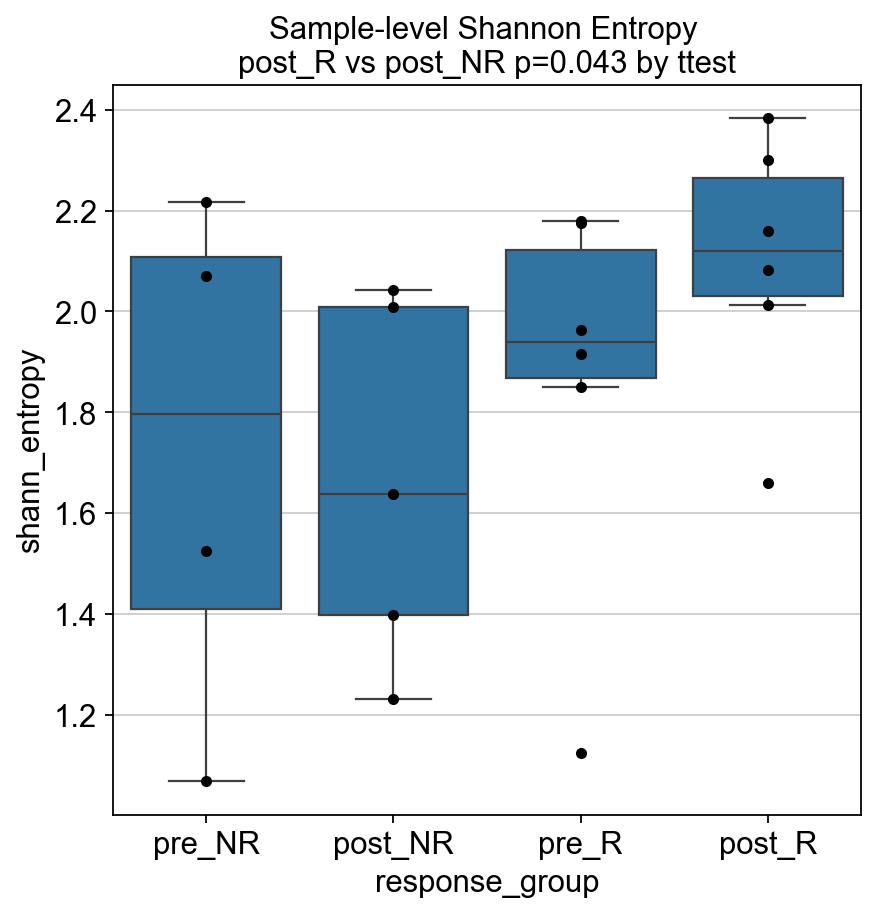

In [47]:
plt.figure()
sns.boxplot(data=entropy_df, x = 'response_group', y = 'shann_entropy', order = ['pre_NR','post_NR','pre_R','post_R'],showfliers=False)
sns.stripplot(data=entropy_df, x = 'response_group', y = 'shann_entropy', order = ['pre_NR','post_NR','pre_R','post_R'], color = 'black', jitter = False)
plt.title("Sample-level Shannon Entropy \npost_R vs post_NR p=0.043 by ttest")
# plt.savefig('./figures/sample_level_shannon_entropy.pdf')
plt.show()

In [48]:
comparisons = ['pre_R,post_R', 'pre_R,post_NR', 'pre_R,pre_NR', 'pre_NR,post_R', 'pre_NR,post_NR', 'post_R,post_NR']

for comp in comparisons:
    # print(comp)
    a = comp.split(',')[0]
    b = comp.split(',')[1]
    df_sub1 = entropy_df[entropy_df['response_group']==a]
    df_sub2 = entropy_df[entropy_df['response_group']==b]
    t,p = ttest_ind(df_sub1['shann_entropy'].astype(float),df_sub2['shann_entropy'].astype(float))
    # p_df.loc[celltype,comp] = np.round(p,3)
    print(comp, p)

pre_R,post_R 0.2505823676222528
pre_R,post_NR 0.394798946454306
pre_R,pre_NR 0.6212472938508066
pre_NR,post_R 0.1608559864772046
pre_NR,post_NR 0.8550011240327959
post_R,post_NR 0.043477160089792355


In [49]:
dists = pl.read_csv(f'{output_path}/spatial_metrics/connectivity_graphs/connectivities_rad1500.csv')
dist = pd.DataFrame(columns =['sample_id', 'patient', 'timepoint','group', 'query_cell', 'qry_cell_id', 'qry_celltype',
                                'ref_cell', 'ref_cell_id', 'ref_celltype', 'distance'])

for col in dists.columns:
    dist[col] = dists[col]
    
dist = dist[dist['distance']<100]

dist.shape

(1804980, 11)

In [50]:

dist.head()

,sample_id,patient,timepoint,group,query_cell,qry_cell_id,qry_celltype,ref_cell,ref_cell_id,ref_celltype,distance
26,R05_pre,R05,pre,R,9,R05_pre_57615,NK-cell,8,R05_pre_57614,Erythroid,23.427766
28,R05_pre,R05,pre,R,8,R05_pre_57614,Erythroid,9,R05_pre_57615,NK-cell,23.427766
37,R05_pre,R05,pre,R,14,R05_pre_57628,Monocyte,13,R05_pre_57627,Monocyte,12.994875
38,R05_pre,R05,pre,R,15,R05_pre_57630,Monocyte,13,R05_pre_57627,Monocyte,35.360278
216,R05_pre,R05,pre,R,13,R05_pre_57627,Monocyte,14,R05_pre_57628,Monocyte,12.994875


In [51]:
a = dist[dist['qry_cell_id']=='R05_pre_57615']
aa = a.iloc[0]
aa['sample_id']

'R05_pre'

In [137]:
b,c = np.unique(a['ref_celltype'], return_counts = True)

In [139]:
entropy(c)

0.0

In [52]:
diversity_df = pd.DataFrame(index = np.unique(dist['qry_cell_id']), columns = ['sample_id','response','timepoint','response_group', 'entropy'])
for cell in np.unique(dist['qry_cell_id']):
    sample = dist[dist['qry_cell_id']==cell]
    sample_sub = sample.iloc[0]
    sample_id = sample_sub['sample_id']
    response = sample_sub['group']
    time = sample_sub['timepoint']
    a,c = np.unique(sample['ref_celltype'], return_counts = True)
    e = entropy(c)
    rg = time + '_' + response
    diversity_df.loc[cell,:] = [sample_id, response, time, rg, e]

    

In [145]:
diversity_df

,sample_id,response,timepoint,response_group,entropy
NR02_post_167483,NR02_post,NR,post,post_NR,1.039721
NR02_post_167485,NR02_post,NR,post,post_NR,1.098612
NR02_post_167487,NR02_post,NR,post,post_NR,1.098612
NR02_post_167495,NR02_post,NR,post,post_NR,1.098612
NR02_post_167499,NR02_post,NR,post,post_NR,0.693147
...,...,...,...,...,...
R15_pre_167409,R15_pre,R,pre,pre_R,0.562335
R15_pre_167410,R15_pre,R,pre,pre_R,0.562335
R15_pre_167412,R15_pre,R,pre,pre_R,0.562335
R15_pre_167416,R15_pre,R,pre,pre_R,0.0


In [ ]:
# add subsampling

In [146]:
diversity_df.to_csv('diversity_df_by_cell.csv')

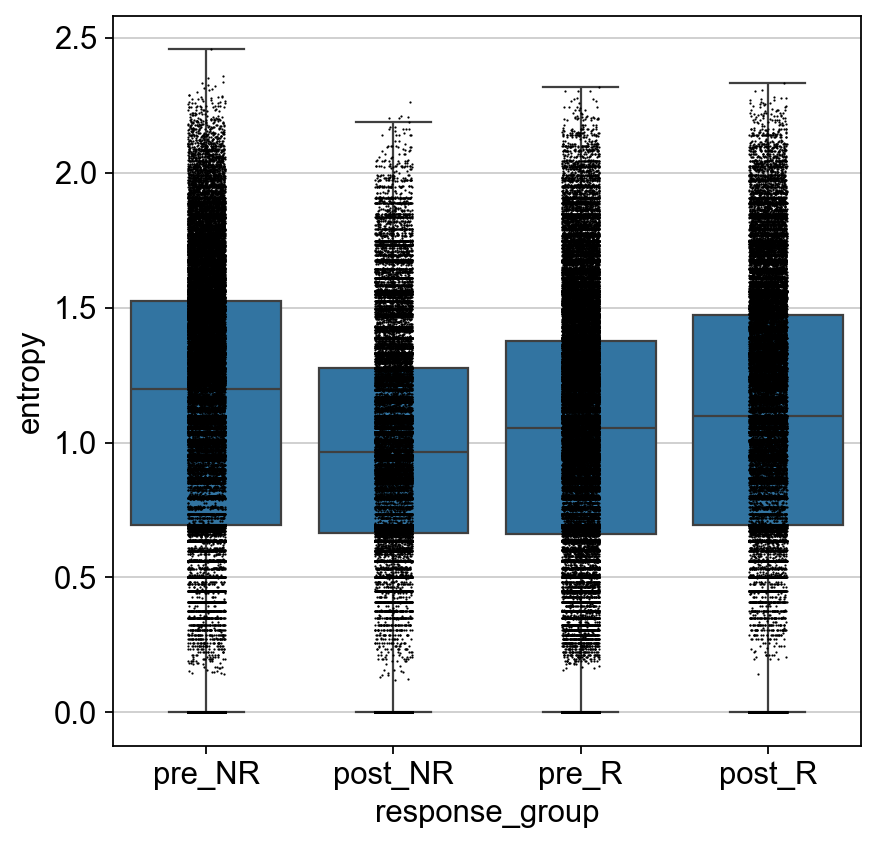

In [53]:
plt.figure()
sns.boxplot(data = diversity_df, x = 'response_group', y = 'entropy', order = ['pre_NR','post_NR','pre_R','post_R'], showfliers = False)
sns.stripplot(data = diversity_df, x = 'response_group', y = 'entropy', order = ['pre_NR','post_NR','pre_R','post_R'], color = 'black', s = 1)
plt.show()

In [151]:
# r_post = diversity_df[diversity_df['response_group']=='post_R']
# nr_post = diversity_df[diversity_df['response_group']=='post_NR']
ttest_ind(r_post['entropy'].astype(float),nr_post['entropy'].astype(float))

TtestResult(statistic=35.441126880583035, pvalue=8.151491490575472e-273, df=73372.0)

In [153]:
diversity_sample = pd.DataFrame(index = np.unique(diversity_df['sample_id']),columns = ['entropy','response_group'])

for samp in np.unique(diversity_df['sample_id']):
    df = diversity_df[diversity_df['sample_id']==samp]
    rg = df.iloc[0]
    rg = rg['response_group']
    e = np.mean(df['entropy'])

    diversity_sample.loc[samp] = [e,rg]
                                

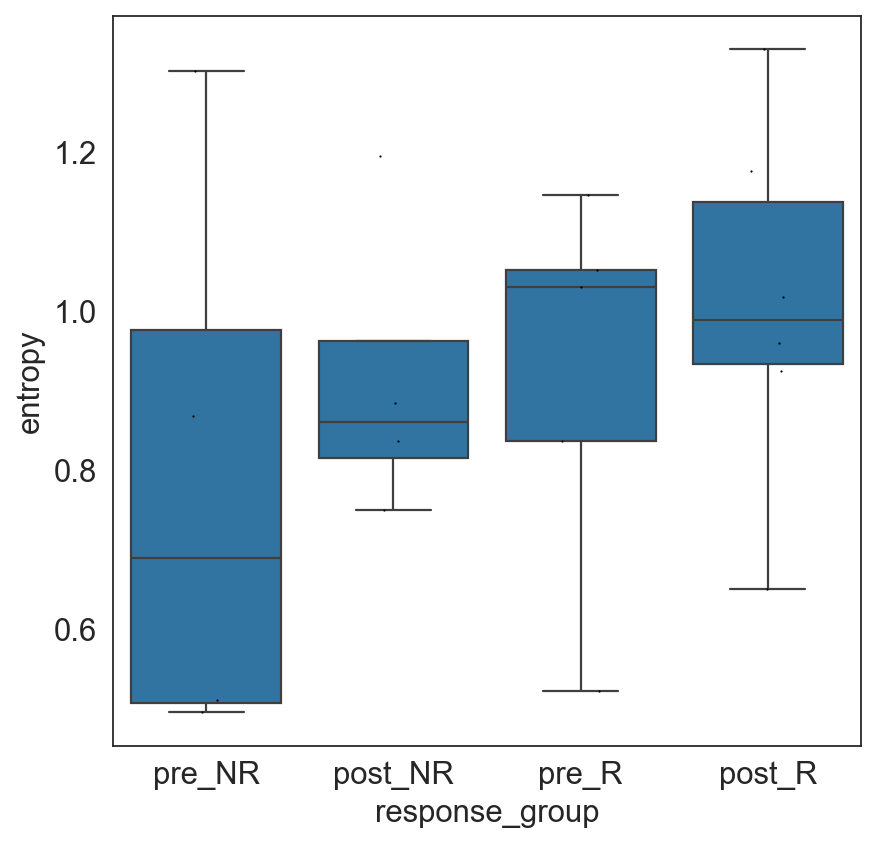

0.528180315648006


In [156]:
plt.figure()
sns.boxplot(data = diversity_sample, x = 'response_group', y = 'entropy', order = ['pre_NR','post_NR','pre_R','post_R'], showfliers = False)
sns.stripplot(data = diversity_sample, x = 'response_group', y = 'entropy', order = ['pre_NR','post_NR','pre_R','post_R'], color = 'black', s = 1)
plt.show()


r_post = diversity_sample[diversity_sample['response_group']=='post_R']
nr_post = diversity_sample[diversity_sample['response_group']=='post_NR']
t, p = ttest_ind(r_post['entropy'].astype(float),nr_post['entropy'].astype(float))
print(p)

In [48]:
# fc['comp'] = 'x'

In [49]:
# (
#     ggplot(fc, aes(x = 'comp', y='shann_div', fill='time_group'))
#     + pn.geom_boxplot()
#     + pn.scale_fill_manual(values=cols)
#     + pn.geom_point(position=pn.position_dodge(width=0.75))
#     + pn.ggtitle(f'Shannon diversity index @ {radius}px')
#     + sy.style
#     + pn.theme(figure_size=[10,6], axis_text_x=pn.element_text(angle=90))
# )

## look at recalculating shannon index for whole area 


In [50]:
# # comparisons = ['pre_R,post_R', 'pre_R,post_NR', 'pre_R,pre_NR', 'pre_NR,post_R', 'pre_NR,post_NR', 'post_R,post_NR']

# p_df = pd.DataFrame(index = np.unique(fc['qry_celltype']), columns = comparisons)

# # for celltype in np.unique(fc['qry_celltype']):
# df = fc
# for comp in comparisons:
#     # print(comp)
#     a = comp.split(',')[0]
#     b = comp.split(',')[1]
#     df_sub1 = df[df['time_group']==a]
#     df_sub2 = df[df['time_group']==b]
#     t,p = ttest_ind(df_sub1['shann_div'],df_sub2['shann_div'])
#     p_df.loc[celltype,comp] = np.round(p,3)
#     if p<0.1: print(comp, p)

In [640]:
# p_df.to_csv('p_values_shannon_diversity.csv')

In [ ]:
# stats comparing all groups at 100 and 200 px

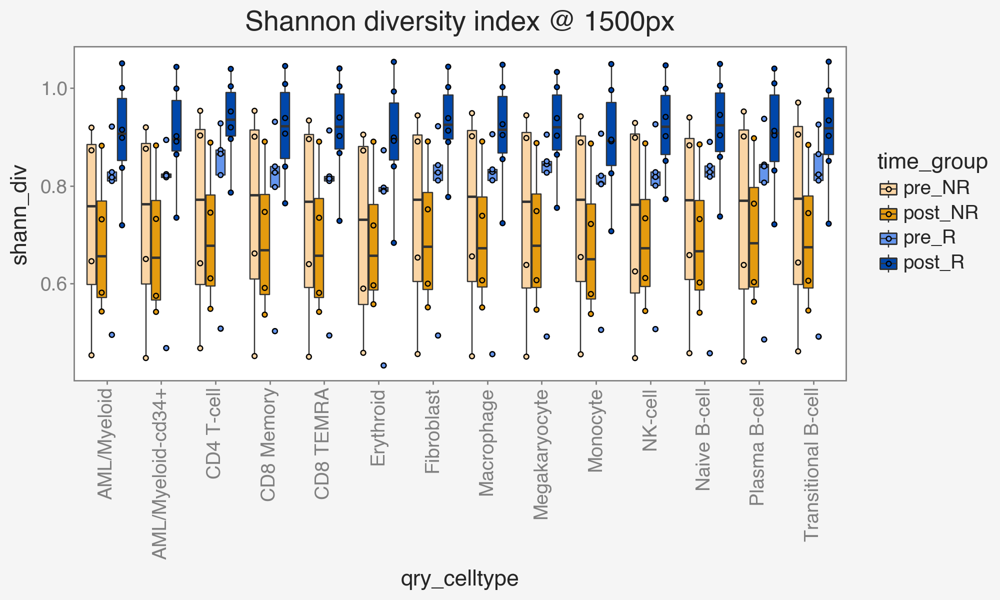

In [51]:
radius = 1500

shannon_div = mean_divs.filter(radius=radius)

# g = (
#     ggplot(shannon_div, aes(x='qry_celltype', y='shann_div', fill='time_group'))
#     + pn.geom_boxplot()
#     + pn.scale_fill_manual(values=cols)
#     + pn.geom_point(position=pn.position_dodge(width=0.75))
#     + pn.ggtitle(f'Shannon diversity index @ {radius}px')
#     + sy.style
#     + pn.theme(figure_size=[10,6], axis_text_x=pn.element_text(angle=90))
# )



# ggplot.save( g,
#     filename="shannon_diversity_boxplot_1500px.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )


(
    ggplot(shannon_div, aes(x='qry_celltype', y='shann_div', fill='time_group'))
    + pn.geom_boxplot()
    + pn.scale_fill_manual(values=cols)
    + pn.geom_point(position=pn.position_dodge(width=0.75))
    + pn.ggtitle(f'Shannon diversity index @ {radius}px')
    + sy.style
    + pn.theme(figure_size=[10,6], axis_text_x=pn.element_text(angle=90))
)

In [52]:
fc = pd.DataFrame(columns = ['sample_id','patient','timepoint', 'group', 'qry_celltype', 'shann_div', 'radius', 'time_group'])
for col in shannon_div.columns:
    fc[col] = shannon_div[col]

# comparisons = ['pre_R,post_R', 'pre_R,post_NR', 'pre_R,pre_NR', 'pre_NR,post_R', 'pre_NR,post_NR', 'post_R,post_NR']

p_df = pd.DataFrame(index = np.unique(fc['qry_celltype']), columns = comparisons)

for celltype in np.unique(fc['qry_celltype']):
    df = fc[fc['qry_celltype']==celltype]
    for comp in comparisons:
        # print(comp)
        a = comp.split(',')[0]
        b = comp.split(',')[1]
        df_sub1 = df[df['time_group']==a]
        df_sub2 = df[df['time_group']==b]
        t,p = ttest_ind(df_sub1['shann_div'],df_sub2['shann_div'])
        p_df.loc[celltype,comp] = np.round(p,3)
        if p<0.1: print(celltype, comp, p)


AML/Myeloid post_R,post_NR 0.03415943702497417
AML/Myeloid-cd34+ post_R,post_NR 0.0279621792045501
CD4 T-cell pre_NR,post_R 0.09465974565470486
CD4 T-cell post_R,post_NR 0.014143023125736
CD8 Memory post_R,post_NR 0.025799393450019782
CD8 TEMRA post_R,post_NR 0.028029650716419736
Erythroid post_R,post_NR 0.05103191606531567
Fibroblast pre_R,post_R 0.09304467345624057
Fibroblast pre_NR,post_R 0.09481706470649905
Fibroblast post_R,post_NR 0.018092839679444788
Macrophage post_R,post_NR 0.03439104695853509
Megakaryocyte post_R,post_NR 0.024556672528010207
Monocyte post_R,post_NR 0.04222885894248381
NK-cell pre_NR,post_R 0.09968841010574826
NK-cell post_R,post_NR 0.020738510283243767
Naive B-cell post_R,post_NR 0.025529414093606484
Plasma B-cell post_R,post_NR 0.05018127349515614
Transitional B-cell post_R,post_NR 0.03372809450063486


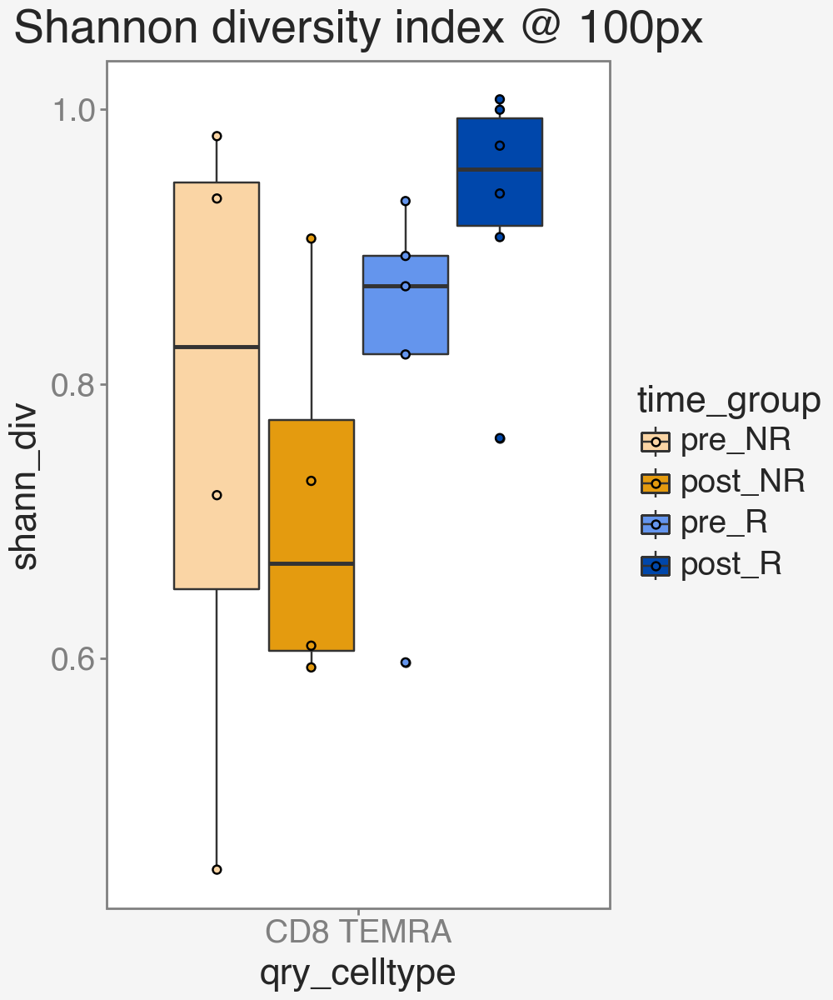

In [53]:
radius = 100

shannon_div = mean_divs.filter(qry_celltype='CD8 TEMRA', radius=radius)

# g = (
#     ggplot(shannon_div, aes(x='qry_celltype', y='shann_div', fill='time_group'))
#     + pn.geom_boxplot()
#     + pn.scale_fill_manual(values=cols)
#     + pn.geom_point(position=pn.position_dodge(width=0.75))
#     + pn.ggtitle(f'Shannon diversity index @ {radius}px')
#     + sy.style
#     + pn.theme(figure_size=[5,6], axis_text_x=pn.element_text(angle=0))
# )



# ggplot.save( g,
#     filename="shannon_diversity_boxplot_100px_justTEMRA.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )


(
    ggplot(shannon_div, aes(x='qry_celltype', y='shann_div', fill='time_group'))
    + pn.geom_boxplot()
    + pn.scale_fill_manual(values=cols)
    + pn.geom_point(position=pn.position_dodge(width=0.75))
    + pn.ggtitle(f'Shannon diversity index @ {radius}px')
    + sy.style
    + pn.theme(figure_size=[5,6], axis_text_x=pn.element_text(angle=0))
)

In [143]:
# fold change and diversity cd8 temra for main, then single box plots of any that are significant for supp, table with fold change with p val  as supp table
# normalize by lymphoids 



array(['AML/Myeloid', 'AML/Myeloid-cd34+', 'CD4 T-cell', 'CD8 Memory',
       'CD8 TEMRA', 'Erythroid', 'Fibroblast', 'Macrophage',
       'Megakaryocyte', 'Monocyte', 'NK-cell', 'Naive B-cell',
       'Plasma B-cell', 'Transitional B-cell'], dtype=object)

### plot shannon diversity of CD8 TEMRA neighborhoods across distances

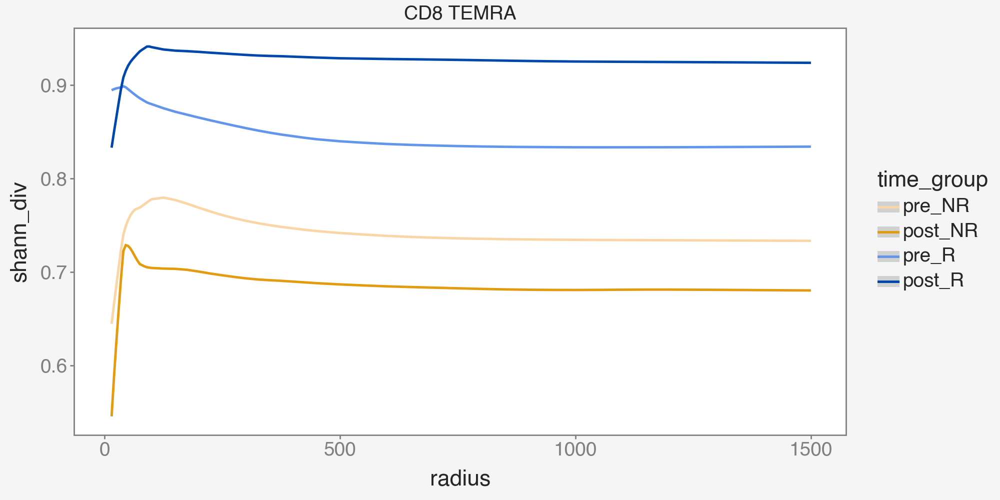

In [54]:
import warnings
#from plotnine import PlotnineWarning
warnings.filterwarnings("ignore")

ref_types = ['AML/Myeloid','AML/Myeloid-cd34+', 'CD4 T-cell', 'CD8 Memory', 'CD8 TEMRA', 'Erythroid', 'Monocyte', 'Myeloid', 'NK-cell']
ref_types = ['CD8 TEMRA']

cols = ['#FAD5A5', '#E49B0F', '#6495ED', '#0047AB']

# g=(
#     ggplot(mean_divs.filter(pl.col('qry_celltype').is_in(ref_types)), aes(x='radius', y='shann_div', color='time_group'))
#     #+ pn.geom_point()
#     + pn.geom_smooth(method='lowess', span=0.2)
#     + pn.scale_color_manual(values=cols)
#     + pn.facet_wrap('qry_celltype', nrow=1)
#     + pn.xlim([10, 1500])
#     #+ pn.ylim([0.4, 1])
#     + sy.style
#     + pn.theme(figure_size=[10,5])
# )



# ggplot.save( g,
#     filename="diversity_at_differentR_TEMRA_lineplot.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )


(
    ggplot(mean_divs.filter(pl.col('qry_celltype').is_in(ref_types)), aes(x='radius', y='shann_div', color='time_group'))
    #+ pn.geom_point()
    + pn.geom_smooth(method='lowess', span=0.2)
    + pn.scale_color_manual(values=cols)
    + pn.facet_wrap('qry_celltype', nrow=1)
    + pn.xlim([10, 1500])
    #+ pn.ylim([0.4, 1])
    + sy.style
    + pn.theme(figure_size=[10,5])
)

### plot normalized diversity changes within a treatment group across radii

In [297]:
# df = (
#     mean_divs.drop("sample_id", "time_group")
#     .pivot(on="timepoint", values="shann_div", index=["patient", 'group', "qry_celltype", "radius"])
#     .filter(pl.col("post").is_not_null(),
#             pl.col("pre").is_not_null())
#     .with_columns((pl.col('post') / pl.col('pre')).log(2).alias('logfc'))
# )

# radii = list(range(0, 100, 5)) + list(range(100, 500, 25)) + list(range(500, 1550, 50))
# radius_order = pl.Enum([str(rad) for rad in radii])

# (
#     ggplot(df.filter(qry_celltype='CD8 TEMRA'), aes(x='radius', y='logfc', color='group'))
#     + pn.geom_vline(xintercept=100, color = '0.75')
#     + pn.geom_hline(yintercept=0)
#     + pn.geom_smooth(method='lowess', span=0.1)
#     + pn.scale_color_manual(values=[cols[1], cols[3]])
#     + pn.xlim([50, 1500])
#     + pn.ylab('logfc(post/pre)')
#     + pn.ggtitle('CD8 TEMRA n.hood diversity changes')
#     + sy.style
#     + pn.theme(figure_size=[8,5])
# )

# Selection of 100px as interesting neighborhood radius

when plotting neighborhood compositions across increasing radii, we see that for most celltypes signal flucturations appears to concentrate below 500px

In [298]:
# (
#     ggplot(mean_neighbors.filter(pl.col('qry_celltype').is_in(['CD8 TEMRA']), time_group='post_R'), aes(x='radius', y='obs_frac', color='ref_celltype'))
#     + pn.geom_smooth(method='lowess', span=0.1, se=False)
#     + pn.scale_color_manual(values=sc.pl.palettes.default_20)
#     + pn.ggtitle('CD8 TEMRA neighborhood compositions across increasing radii')
#     + sy.style
#     + pn.theme(figure_size=[10,6])
# )


narrowing the scale and considering more celltypes, 100px becomes a reasonable cutoff. This also makes sense as neighborhoods get very small when decreasing cutoff even further

In [299]:
# (
#     ggplot(mean_neighbors.filter(pl.col('qry_celltype').is_in(['CD8 TEMRA', 'CD4 T-cell', 'Myeloid', 'Fibroblast'])), aes(x='radius', y='obs_frac', color='ref_celltype'))
#     + pn.geom_smooth(method='lowess', span=0.1, se=False)
#     + pn.scale_color_manual(values=sc.pl.palettes.default_20)
#     + pn.xlim([0, 350])
#     + pn.facet_wrap(facets='qry_celltype')
#     + sy.style
#     + pn.theme(figure_size=[10,7])
# )

# Neighborhood clustering

### create neighborhood proportion matrix from cell-level neighborhood data. We filter out cells that have fewer than 10 neighbors within a 100px radius

In [48]:
radius = 100
nhood_size = 10

neighs = pl.read_csv(f'{output_path}/spatial_metrics/neighborhoods_cell_level/cell_neighborhood_proportions_rad{radius}.csv').filter(pl.col('nhood_size') >= nhood_size)

neigh_pivot = neighs.select('sample_id', 'qry_cell_id', 'qry_celltype', 'ref_celltype', 'obs_frac').pivot(on='ref_celltype', values='obs_frac', index=['sample_id', 'qry_cell_id', 'qry_celltype'])
mtx = neigh_pivot.drop('sample_id', 'qry_celltype').to_pandas().set_index('qry_cell_id')

calculate linkage matrices for cells (rows) and neighborhood proportions (columns). Might be worthwhile trying other clustering methods as well, but 'ward' gives mostly evenly sized clusters

In [49]:
row_linkage = fastcluster.linkage(mtx.to_numpy(),   method='ward')
col_linkage = fastcluster.linkage(mtx.to_numpy().T, method='ward')

In [50]:
# set cutoff for cluster number and extract cluster identities
linkage_matrix = row_linkage
max_d = 14.5  # Set the distance threshold, which controls number of clusters.
clusters = sch.fcluster(linkage_matrix, max_d, criterion='distance')

print(list(np.unique(clusters)))

# plot annotation of clusters
cluster_colors = tap1_auxfns.color_pair(groups=list(np.unique(clusters)), colors=sy.mode20b, variable_name='cluster')

mtx_copy = mtx.copy()

mtx_copy['cluster'] = clusters
mtx_copy = mtx_copy.reset_index().merge(cluster_colors.to_pandas(), on='cluster')

# plot annotation of treatment groups
group_time_colors = tap1_auxfns.color_pair(groups=['NR_pre', 'NR_post', 'R_pre', 'R_post'], colors=['#FAD5A5', '#E49B0F', '#6495ED', '#0047AB'], variable_name='group_time')
group_time_colors = neighs.select('qry_cell_id', 'group_time').unique(maintain_order=True).join(group_time_colors, on='group_time').drop('group_time').to_pandas().set_index('qry_cell_id')

# final annotation
colors = mtx_copy[['qry_cell_id', 'cluster_color']].merge(group_time_colors.reset_index('qry_cell_id'), on='qry_cell_id', how='left').set_index('qry_cell_id')

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]


### plot the results

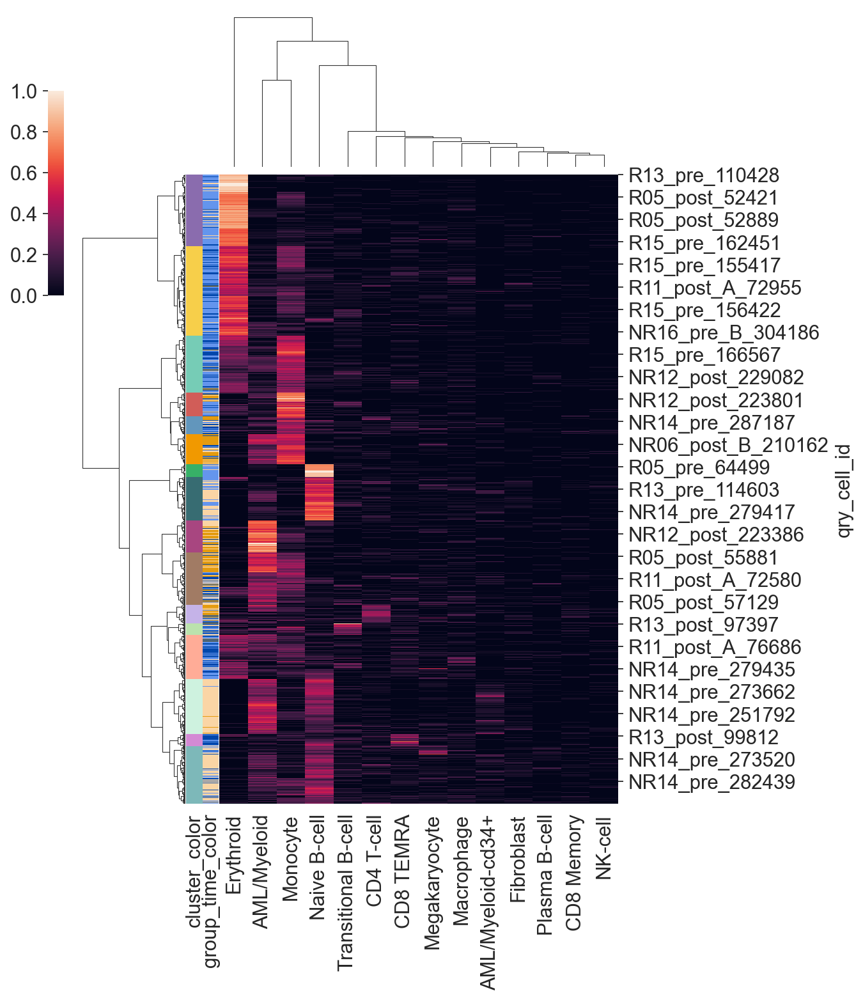

In [51]:
sns.set_style("white")
sns.clustermap(mtx, figsize=[8, 10], row_linkage=row_linkage, col_linkage=col_linkage, row_colors=colors, cbar_pos=(-0.01, 0.7, 0.02, 0.2), cbar_kws={'ticklocation':'left'})
plt.show()

In [52]:
mtx_copy['sample'] = [cell.split('_')[0]+'_'+cell.split('_')[1] for cell in mtx_copy['qry_cell_id'] ]

mtx_copy['time'] = [cell.split('_')[1] for cell in mtx_copy['qry_cell_id'] ]

mtx_copy['response'] = 'R'

for cell in mtx_copy.index:
    id = mtx_copy.loc[cell,'qry_cell_id']
    if 'NR' in id:
        mtx_copy.loc[cell,'response'] = 'NR'
mtx_copy['response_group'] = [mtx_copy.loc[cell,'response']+'_'+mtx_copy.loc[cell,'time'] for cell in mtx_copy.index]
mtx_copy

,qry_cell_id,Fibroblast,CD8 Memory,Plasma B-cell,AML/Myeloid,AML/Myeloid-cd34+,Transitional B-cell,CD8 TEMRA,NK-cell,Megakaryocyte,...,Macrophage,Erythroid,Naive B-cell,Monocyte,cluster,cluster_color,sample,time,response,response_group
0,R01_post_187,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,...,0.1,0.300000,0.100000,0.500000,3,#76ccb6,R01_post,post,R,R_post
1,R01_post_1535,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.100000,0.0,0.0,...,0.0,0.300000,0.200000,0.400000,3,#76ccb6,R01_post,post,R,R_post
2,R01_post_2167,0.071429,0.0,0.071429,0.000000,0.0,0.142857,0.000000,0.0,0.0,...,0.0,0.285714,0.142857,0.214286,3,#76ccb6,R01_post,post,R,R_post
3,R01_post_2170,0.000000,0.0,0.000000,0.076923,0.0,0.076923,0.000000,0.0,0.0,...,0.0,0.384615,0.076923,0.307692,3,#76ccb6,R01_post,post,R,R_post
4,R01_post_2196,0.000000,0.0,0.000000,0.125000,0.0,0.062500,0.000000,0.0,0.0,...,0.0,0.375000,0.125000,0.250000,3,#76ccb6,R01_post,post,R,R_post
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78891,NR14_pre_286337,0.000000,0.0,0.000000,0.000000,0.0,0.055556,0.111111,0.0,0.0,...,0.0,0.055556,0.722222,0.055556,7,#37b067,NR14_pre,pre,NR,NR_pre
78892,NR14_pre_286342,0.000000,0.0,0.000000,0.000000,0.0,0.200000,0.000000,0.0,0.0,...,0.0,0.000000,0.800000,0.000000,7,#37b067,NR14_pre,pre,NR,NR_pre
78893,NR14_pre_286362,0.000000,0.0,0.000000,0.000000,0.0,0.200000,0.000000,0.0,0.0,...,0.0,0.000000,0.800000,0.000000,7,#37b067,NR14_pre,pre,NR,NR_pre
78894,NR14_pre_286381,0.000000,0.0,0.000000,0.000000,0.0,0.100000,0.000000,0.0,0.0,...,0.0,0.000000,0.900000,0.000000,7,#37b067,NR14_pre,pre,NR,NR_pre


In [60]:
## niches by response, normalized by number of cells in each sample, removing samples with less than 500 cells
# sns.set_style('white')
# COMP = 'response_group'
# cluster_df = pd.DataFrame(index = np.unique(mtx_copy['cluster']), columns = np.unique(mtx_copy[COMP]))
# cluster_df = cluster_df.fillna(0)
# for niche in np.unique(mtx_copy['cluster']):

#     df = mtx_copy[mtx_copy['cluster'] == niche]
#     a,c = np.unique(df[COMP], return_counts = True)
#     for i, val in enumerate(a):
#         cluster_df.loc[niche,val] = c[i]

# c = cluster_df.sum()
# low = c[c<500]
# cluster_df = cluster_df.drop(columns = low.index)  

# cluster_norm = cluster_df.div(cluster_df.sum())
# c_sum = cluster_norm.sum(axis = 1)

# df_ratios = cluster_norm.div(c_sum, axis = 0)

# color_arr = random_colors(len(df_ratios.columns)+2)
# labels = [str(i) for i in df_ratios.index] 

# fig, ax = plt.subplots(figsize=[30, 5])
# width = 0.75       # the width of the bars: can also be len(x) sequence
# bottom_ = np.repeat(0,len(labels)).astype(float)

# for i,samp in enumerate(df_ratios.columns):
#     p = list(df_ratios[samp])
#     if i != 0:
#         bottom_ += list(df_ratios.iloc[:,i-1])
#     ax.bar(labels, p, width, bottom = bottom_, label=samp, color =color_arr[i])


# plt.xticks(fontsize = 24)
# plt.yticks(fontsize =20)
# fig.tight_layout()
# plt.legend(bbox_to_anchor=(0, -0.8), loc='center left',ncol = 2, fontsize = 30)
# plt.title(f'niches_by_{COMP}', fontsize = 30)
# # plt.savefig(f'./figures/niches_by_{COMP}_barplot.pdf')
# plt.show()


In [572]:
# ## niches by response, normalized by number of cells in each sample, removing samples with less than 500 cells
# COMP = 'time'
# cluster_df = pd.DataFrame(index = np.unique(mtx_copy['cluster']), columns = np.unique(mtx_copy[COMP]))
# cluster_df = cluster_df.fillna(0)
# for niche in np.unique(mtx_copy['cluster']):

#     df = mtx_copy[mtx_copy['cluster'] == niche]
#     a,c = np.unique(df[COMP], return_counts = True)
#     for i, val in enumerate(a):
#         cluster_df.loc[niche,val] = c[i]

# c = cluster_df.sum()
# low = c[c<500]
# cluster_df = cluster_df.drop(columns = low.index)  

# cluster_norm = cluster_df.div(cluster_df.sum())
# c_sum = cluster_norm.sum(axis = 1)

# df_ratios = cluster_norm.div(c_sum, axis = 0)

# color_arr = random_colors(len(df_ratios.columns)+2)
# labels = [str(i) for i in df_ratios.index] 

# fig, ax = plt.subplots(figsize=[30, 5])
# width = 0.75       # the width of the bars: can also be len(x) sequence
# bottom_ = np.repeat(0,len(labels)).astype(float)

# for i,samp in enumerate(df_ratios.columns):
#     p = list(df_ratios[samp])
#     if i != 0:
#         bottom_ += list(df_ratios.iloc[:,i-1])
#     ax.bar(labels, p, width, bottom = bottom_, label=samp, color =color_arr[i])


# plt.xticks(fontsize = 24)
# plt.yticks(fontsize =20)
# fig.tight_layout()
# plt.legend(bbox_to_anchor=(0, -0.8), loc='center left',ncol = 2, fontsize = 30)
# plt.title(f'niches_by_{COMP}', fontsize = 30)
# # plt.savefig(f'./figures/niches_by_{COMP}_barplot.pdf')
# plt.show()

In [582]:
# sorted = df_ratios.sort_values(by = 'R_post')
# order_R = list(sorted.index)
# order = list(sorted.index)


# sorted = df_ratios.sort_values(by = 'NR_post')
# order_NR = list(sorted.index)


In [314]:
# df_ratios.loc[order]

## umap of overall cell states with new AML cell states


In [61]:
# ## niches by response, normalized by number of cells in each sample, removing samples with less than 500 cells, sorted by R post

# COMP = 'response_group'
# cluster_df = pd.DataFrame(index = np.unique(mtx_copy['cluster']), columns = np.unique(mtx_copy[COMP]))
# cluster_df = cluster_df.fillna(0)
# for niche in np.unique(mtx_copy['cluster']):

#     df = mtx_copy[mtx_copy['cluster'] == niche]
#     a,c = np.unique(df[COMP], return_counts = True)
#     for i, val in enumerate(a):
#         cluster_df.loc[niche,val] = c[i]

# c = cluster_df.sum()
# low = c[c<500]
# cluster_df = cluster_df.drop(columns = low.index)  

# cluster_norm = cluster_df.div(cluster_df.sum())
# c_sum = cluster_norm.sum(axis = 1)

# df_ratios = cluster_norm.div(c_sum, axis = 0)
# df_ratios = df_ratios.loc[order]
# color_arr = random_colors(len(df_ratios.columns)+2)
# labels = [str(i) for i in df_ratios.index] 


# fig, ax = plt.subplots(figsize=[30, 5])
# width = 0.75       # the width of the bars: can also be len(x) sequence
# bottom_ = np.repeat(0,len(labels)).astype(float)

# for i,samp in enumerate(df_ratios.columns):
#     p = list(df_ratios[samp])
#     if i != 0:
#         bottom_ += list(df_ratios.iloc[:,i-1])
#     ax.bar(labels, p, width, bottom = bottom_, label=samp, color =color_arr[i])


# plt.xticks(fontsize = 24)
# plt.yticks(fontsize =20)
# fig.tight_layout()
# plt.legend(bbox_to_anchor=(0, -0.8), loc='center left',ncol = 2, fontsize = 30)
# plt.title(f'niches_by_{COMP}', fontsize = 30)
# # plt.savefig(f'./figures/niches_by_{COMP}_barplot.pdf')
# plt.show()


In [62]:
# ## niches by sample, normalized by number of cells in each sample, removing samples with less than 500 cells
# cluster_df = pd.DataFrame(index = np.unique(mtx_copy['cluster']), columns = np.unique(mtx_copy['sample']))
# cluster_df = cluster_df.fillna(0)
# for niche in np.unique(mtx_copy['cluster']):

#     df = mtx_copy[mtx_copy['cluster'] == niche]
#     a,c = np.unique(df['sample'], return_counts = True)
#     for i, val in enumerate(a):
#         cluster_df.loc[niche,val] = c[i]

# c = cluster_df.sum()
# low = c[c<500]
# cluster_df = cluster_df.drop(columns = low.index)  

# cluster_norm = cluster_df.div(cluster_df.sum())
# c_sum = cluster_norm.sum(axis = 1)

# df_ratios = cluster_norm.div(c_sum, axis = 0)
# df_ratios = df_ratios.loc[order]
# color_arr = random_colors(len(df_ratios.columns)+2)
# labels = [str(i) for i in df_ratios.index] 

# fig, ax = plt.subplots(figsize=[30, 5])
# width = 0.75       # the width of the bars: can also be len(x) sequence
# bottom_ = np.repeat(0,len(labels)).astype(float)

# for i,samp in enumerate(df_ratios.columns):
#     p = list(df_ratios[samp])
#     if i != 0:
#         bottom_ += list(df_ratios.iloc[:,i-1])
#     ax.bar(labels, p, width, bottom = bottom_, label=samp, color =color_arr[i])


# plt.xticks(fontsize = 24)
# plt.yticks(fontsize =20)
# fig.tight_layout()
# plt.legend(bbox_to_anchor=(0, -0.8), loc='center left',ncol = 2, fontsize = 30)
# plt.title('niches_by_sample', fontsize = 30)
# # plt.savefig(f'./figures/niches_by_sample_barplot.pdf')
# plt.show()

In [63]:
# ## niches by response, normalized by number of cells in each sample, removing samples with less than 500 cells
# COMP = 'response'
# cluster_df = pd.DataFrame(index = np.unique(mtx_copy['cluster']), columns = np.unique(mtx_copy[COMP]))
# cluster_df = cluster_df.fillna(0)
# for niche in np.unique(mtx_copy['cluster']):

#     df = mtx_copy[mtx_copy['cluster'] == niche]
#     a,c = np.unique(df[COMP], return_counts = True)
#     for i, val in enumerate(a):
#         cluster_df.loc[niche,val] = c[i]

# c = cluster_df.sum()
# low = c[c<500]
# cluster_df = cluster_df.drop(columns = low.index)  

# cluster_norm = cluster_df.div(cluster_df.sum())
# c_sum = cluster_norm.sum(axis = 1)

# df_ratios = cluster_norm.div(c_sum, axis = 0)
# df_ratios = df_ratios.loc[order]
# color_arr = random_colors(len(df_ratios.columns)+2)
# labels = [str(i) for i in df_ratios.index] 

# fig, ax = plt.subplots(figsize=[30, 5])
# width = 0.75       # the width of the bars: can also be len(x) sequence
# bottom_ = np.repeat(0,len(labels)).astype(float)

# for i,samp in enumerate(df_ratios.columns):
#     p = list(df_ratios[samp])
#     if i != 0:
#         bottom_ += list(df_ratios.iloc[:,i-1])
#     ax.bar(labels, p, width, bottom = bottom_, label=samp, color =color_arr[i])


# plt.xticks(fontsize = 24)
# plt.yticks(fontsize =20)
# fig.tight_layout()
# plt.legend(bbox_to_anchor=(0, -0.8), loc='center left',ncol = 2, fontsize = 30)
# plt.title(f'niches_by_{COMP}', fontsize = 30)
# # plt.savefig(f'./figures/niches_by_{COMP}_barplot.pdf')
# plt.show()

In [64]:
# ## niches by celltype
# cluster_df = pd.DataFrame(index = np.unique(mtx_copy['cluster']), columns = np.unique(adata.obs['celltype_fine']))
# cluster_df = cluster_df.fillna(0)

# for niche in cluster_df.index:

#     df = mtx_copy[mtx_copy['cluster'] == niche]
#     df = df[cluster_df.columns]
#     cluster_df.loc[niche] = df.mean()
    

# # c = cluster_df.sum()
# # low = c[c<500]
# # cluster_df = cluster_df.drop(columns = low.index)  

# # cluster_norm = cluster_df.div(cluster_df.sum())
# cluster_norm = cluster_df
# c_sum = cluster_norm.sum(axis = 1)
# df_ratios = cluster_norm.div(c_sum, axis = 0)
# df_ratios = df_ratios.loc[order]
# color_arr = random_colors(len(df_ratios.columns)+2)
# labels = [str(i) for i in df_ratios.index] 

# fig, ax = plt.subplots(figsize=[30, 8])
# width = 0.75       # the width of the bars: can also be len(x) sequence
# bottom_ = np.repeat(0,len(labels)).astype(float)

# for i,samp in enumerate(df_ratios.columns):
#     p = list(df_ratios[samp])
#     if i != 0:
#         bottom_ += list(df_ratios.iloc[:,i-1])
#     ax.bar(labels, p, width, bottom = bottom_, label=samp, color =color_arr[i])


# plt.xticks(fontsize = 24)
# plt.yticks(fontsize =20)
# fig.tight_layout()
# plt.legend(bbox_to_anchor=(0, -0.8), loc='center left',ncol = 2, fontsize = 30)
# plt.title('niches_by_celltype_barplot', fontsize = 30)
# # plt.savefig(f'./figures/niches_by_celltype_barplot.pdf')
# plt.show()

In [65]:
# ## niches by celltype
# cluster_df = pd.DataFrame(index = np.unique(mtx_copy['cluster']), columns = np.unique(adata.obs['celltype_fine']))
# cluster_df = cluster_df.fillna(0)

# for niche in cluster_df.index:

#     df = mtx_copy[mtx_copy['cluster'] == niche]
#     df = df[cluster_df.columns]
#     cluster_df.loc[niche] = df.mean()
    

# # c = cluster_df.sum()
# # low = c[c<500]
# # cluster_df = cluster_df.drop(columns = low.index)  

# # cluster_norm = cluster_df.div(cluster_df.sum())
# cluster_norm = cluster_df
# c_sum = cluster_norm.sum(axis = 1)
# df_ratios = cluster_norm.div(c_sum, axis = 0)
# df_ratios = df_ratios.loc[order]
# color_arr = random_colors(len(df_ratios.columns)+2)
# labels = [str(i) for i in df_ratios.index] 

# fig, ax = plt.subplots(figsize=[30, 8])
# width = 0.75       # the width of the bars: can also be len(x) sequence
# bottom_ = np.repeat(0,len(labels)).astype(float)

# for i,samp in enumerate(df_ratios.columns):
#     p = list(df_ratios[samp])
#     if i != 0:
#         bottom_ += list(df_ratios.iloc[:,i-1])
#     ax.bar(labels, p, width, bottom = bottom_, label=samp, color =color_arr[i])


# plt.xticks(fontsize = 24)
# plt.yticks(fontsize =20)
# fig.tight_layout()
# plt.legend(bbox_to_anchor=(0, -0.8), loc='center left',ncol = 2, fontsize = 30)
# plt.title('niches_by_celltype_barplot', fontsize = 30)
# # plt.savefig(f'./figures/niches_by_celltype_barplot.pdf')
# plt.show()

In [53]:
df = pd.DataFrame(adata.X.todense(), index = adata.obs.index, columns = adata.var.index)
df['celltype'] = adata.obs['transferred_ctype']
df['celltype_fine'] = adata.obs['celltype_fine']
df['cell_id'] = adata.obs['cell_id']
df = df[df['cell_id'].isin(mtx_copy['qry_cell_id'])]
df.index = df['cell_id']
mtx_copy.index = mtx_copy['qry_cell_id']
df['cluster'] = 0
df.loc[mtx_copy.index,'cluster'] = mtx_copy['cluster'].astype(int)
df.loc[mtx_copy.index,'response'] = mtx_copy['response']
df.loc[mtx_copy.index,'response_group'] = mtx_copy['response_group']
# email flo where the extra cells when (more in adata than in mtx)

In [58]:
df

,ALCAM,B3GAT1,BACH2,BCL11B,CCL5,CCR5,CCR7,CD14,CD160,CD163,...,XBP1,XCL1,XCL2,ZNF683,celltype,celltype_fine,cell_id,cluster,response,response_group
cell_id,,,,,,,,,,,,,,,,,,,,,
R01_post_187,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,1.94591,0.0,0.000000,...,0.000000,0.0,0.0,0.0,Erythroid,Erythroid,R01_post_187,3,R,R_post
R01_post_547,0.000000,0.0,0.0,0.0,0.0,0.777705,0.000000,0.00000,0.0,0.462624,...,0.777705,0.0,0.0,0.0,AML/Myeloid,AML/Myeloid,R01_post_547,10,R,R_post
R01_post_552,0.747214,0.0,0.0,0.0,0.0,0.000000,0.747214,0.00000,0.0,0.000000,...,0.000000,0.0,0.0,0.0,Transitional B-cell,Transitional B-cell,R01_post_552,10,R,R_post
R01_post_553,0.000000,0.0,0.0,0.0,0.0,1.636650,0.000000,0.00000,0.0,0.000000,...,1.820090,0.0,0.0,0.0,Megakaryocyte,Megakaryocyte,R01_post_553,10,R,R_post
R01_post_557,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0,0.000000,...,0.470004,0.0,0.0,0.0,Monocyte,Monocyte,R01_post_557,10,R,R_post
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NR16_pre_B_311548,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0,1.252763,...,0.000000,0.0,0.0,0.0,Naive B-cell,Naive B-cell,NR16_pre_B_311548,10,NR,NR_pre
NR16_pre_B_311550,0.000000,0.0,0.0,0.0,0.0,0.834798,0.000000,0.00000,0.0,1.283346,...,0.000000,0.0,0.0,0.0,T-cell,CD8 TEMRA,NR16_pre_B_311550,10,NR,NR_pre
NR16_pre_B_311556,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.00000,0.0,2.397895,...,0.000000,0.0,0.0,0.0,Macrophage,Macrophage,NR16_pre_B_311556,16,NR,NR_pre


In [59]:
# df = df[df['response']=='R']
df =df[df['celltype']=='T-cell']
print(df.shape)

(7181, 164)


In [60]:
df_responder = df[df['response']=='R'] 
df_nonresponder = df[df['response']=='NR'] 
a1,c1 = np.unique(df_responder['cluster'],return_counts= True)
a2,c2 = np.unique(df_nonresponder['cluster'],return_counts= True)

In [61]:
r_keep = a1[c1>100]

In [62]:
nr_keep = a2[c2>100]

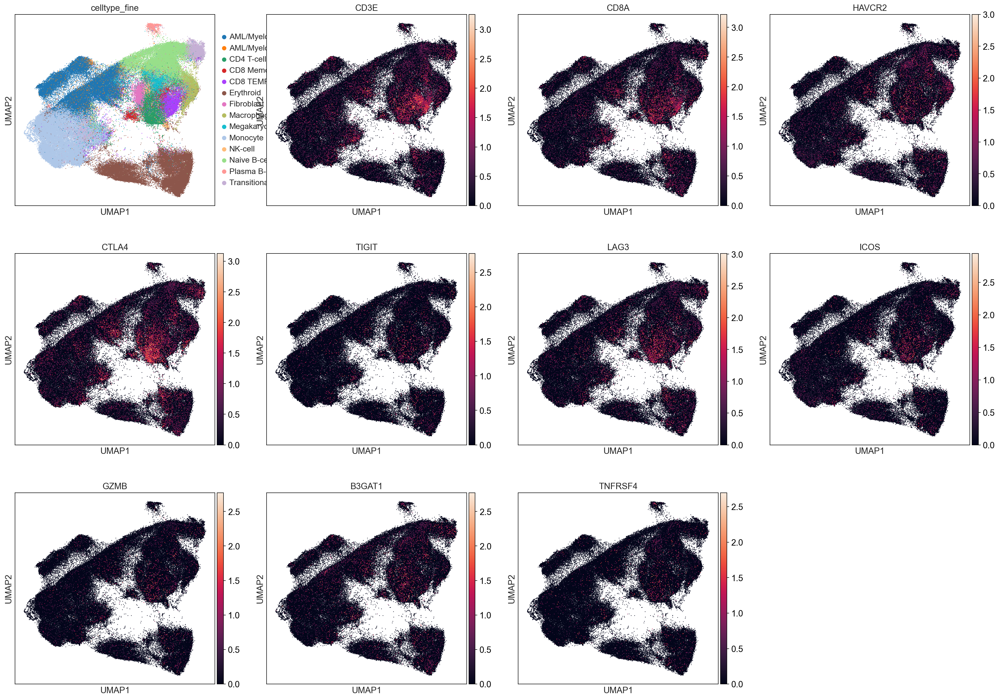

In [54]:
sc.set_figure_params(figsize=[6,6])

sc.pl.umap(
    adata,
    color=['celltype_fine','CD3E','CD8A','HAVCR2','CTLA4','TIGIT','LAG3','ICOS','GZMB','B3GAT1','TNFRSF4'],
    size=5,
    palette=sc.pl.palettes.default_20,
    
    # save = "umap_sg.pdf"
)

In [66]:
# genes = ['HAVCR2','CTLA4','TIGIT','LAG3','ICOS','GZMB','B3GAT1','TNFRSF4']
# DF = df_responder[df_responder['cluster'].isin(r_keep)]
# cluster_genes = pd.DataFrame(index = np.unique(DF['cluster']), columns = genes)
# for cluster in np.unique(DF['cluster']):
#     sub_df = DF[DF['cluster']==cluster]
#     sub_df = sub_df[genes]
#     cluster_genes.loc[cluster] = sub_df.mean()


# cluster_z = pd.DataFrame(index = np.unique(DF['cluster']), columns = genes)
# from scipy.stats import zscore
# for gene in cluster_genes.columns:
#     cluster_z[gene] = zscore(cluster_genes[gene].astype(float))


# new_order = []

# for cluster in order_R:
#     if cluster in r_keep:
#         new_order.append(cluster)

# cluster_z = cluster_z.loc[new_order]
# cluster_genes = cluster_genes.loc[new_order]


# plt.figure(figsize = (10,5))
# sns.heatmap(cluster_genes.T.astype(float),
#             vmax = 0.1,
#             cmap = 'vlag')
# plt.title('R-non zscore')
# plt.show()


# plt.figure(figsize = (10,5))
# sns.heatmap(cluster_z.T.astype(float),
#            vmin = -1, vmax = 1,
#            cmap = 'vlag')
# plt.title('R- zscore')
# plt.show()

In [67]:
# genes = ['HAVCR2','CTLA4','TIGIT','LAG3','ICOS','GZMB','B3GAT1','TNFRSF4']
# DF = df_nonresponder[df_nonresponder['cluster'].isin(nr_keep)]
# cluster_genes = pd.DataFrame(index = np.unique(DF['cluster']), columns = genes)
# for cluster in np.unique(DF['cluster']):
#     sub_df = DF[DF['cluster']==cluster]
#     sub_df = sub_df[genes]
#     cluster_genes.loc[cluster] = sub_df.mean()


# cluster_z = pd.DataFrame(index = np.unique(DF['cluster']), columns = genes)
# from scipy.stats import zscore
# for gene in cluster_genes.columns:
#     cluster_z[gene] = zscore(cluster_genes[gene].astype(float))


# new_order = []

# for cluster in order_NR:
#     if cluster in nr_keep:
#         new_order.append(cluster)

# cluster_z = cluster_z.loc[new_order]
# cluster_genes = cluster_genes.loc[new_order]


# plt.figure(figsize = (10,5))
# sns.heatmap(cluster_genes.T.astype(float),
#             vmax = 0.1,
#             cmap = 'vlag')
# plt.title('NR-non zscore')
# plt.show()


# plt.figure(figsize = (10,5))
# sns.heatmap(cluster_z.T.astype(float),
#            vmin = -1, vmax = 1,
#            cmap = 'vlag')
# plt.title('NR- zscore')
# plt.show()

### plot distribution of niches across samples

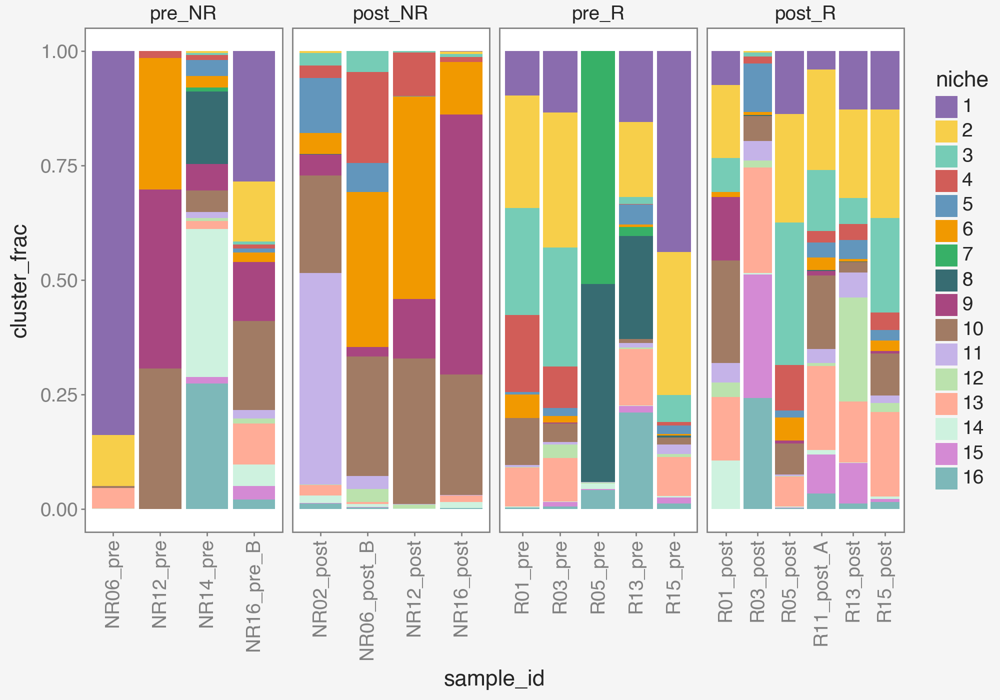

In [55]:
cell_cluster = pl.from_pandas(mtx_copy[['qry_cell_id', 'cluster']])
cell_meta = neighs.select('qry_cell_id', 'patient', 'timepoint', 'group', 'nhood_size').unique(maintain_order=True)
                              
cluster_assign = neigh_pivot.join(cell_meta, on='qry_cell_id').join(cell_cluster, on='qry_cell_id')


sample_size = cluster_assign.group_by("sample_id").agg(pl.len().alias("smp_size"))

niche_fractions = (
    cluster_assign.group_by("sample_id", "timepoint", "group", "cluster")
    .agg(pl.len().alias("cluster_size"))
    .join(sample_size, on="sample_id")
    .with_columns((pl.col('cluster_size') / pl.col('smp_size')).alias('cluster_frac'))
)

group_order = pl.Enum(['pre_NR', 'post_NR', 'pre_R', 'post_R'])
cluster_order = pl.Enum([str(i) for i in list(range(1, len(np.unique(clusters))+1))])

niche_fractions = niche_fractions.with_columns(pl.col('cluster').cast(pl.String).cast(dtype=cluster_order))
niche_fractions = niche_fractions.with_columns((pl.col('timepoint') + "_" + pl.col('group')).cast(dtype=group_order).alias('time_group'))

niche_fractions.write_csv(f'{output_path}/plot_resources/sample_level_niche_fractions.csv')

# g=(
#     ggplot(niche_fractions, aes(x='sample_id', y='cluster_frac', fill='cluster'))
#     + pn.geom_col()
#     + pn.scale_fill_manual(values=sy.mode20b)
#     + sy.style
#     + pn.labs(fill='niche')
#     + pn.theme(figure_size= [10,7], axis_text_x=pn.element_text(angle=90))
#     + pn.facet_wrap('time_group', scales='free_x', nrow=1)
# )



# ggplot.save( g,
#     filename="niches_by_sample.pdf",
#     format=None,
#     path="./figures/",
#     width=None,
#     height=None,
#     units="in",
#     dpi=None,
#     limitsize=True,
#     verbose=True,
# )

(
    ggplot(niche_fractions, aes(x='sample_id', y='cluster_frac', fill='cluster'))
    + pn.geom_col()
    + pn.scale_fill_manual(values=sy.mode20b)
    + sy.style
    + pn.labs(fill='niche')
    + pn.theme(figure_size= [10,7], axis_text_x=pn.element_text(angle=90))
    + pn.facet_wrap('time_group', scales='free_x', nrow=1)
)




In [180]:
np.unique(fc['smp_size'])

array([   94,   261,   330,   565,   633,  1542,  1690,  2710,  2796,
        2911,  2918,  2948,  3288,  4521,  4935,  6133,  9224, 11270,
       20127], dtype=uint32)

In [56]:
fc = pd.DataFrame(columns = ['sample_id', 'timepoint', 'group', 'cluster', 'cluster_size', 'smp_size', 'cluster_frac', 'time_group'])
for col in niche_fractions.columns:
    fc[col] = niche_fractions[col]

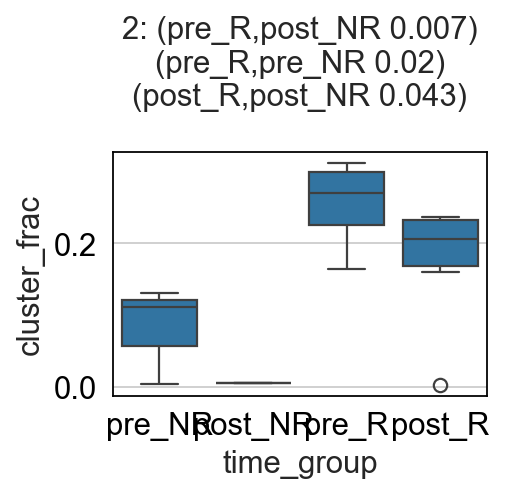

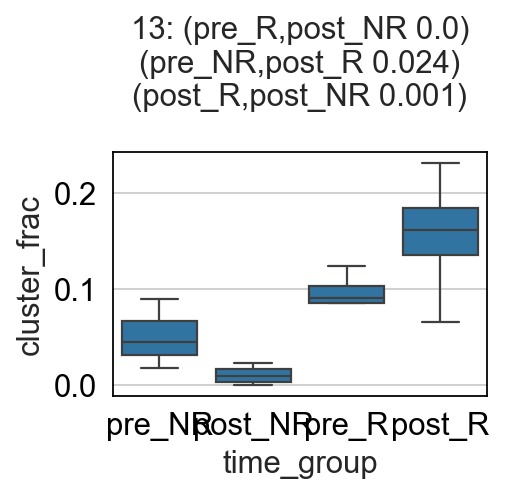

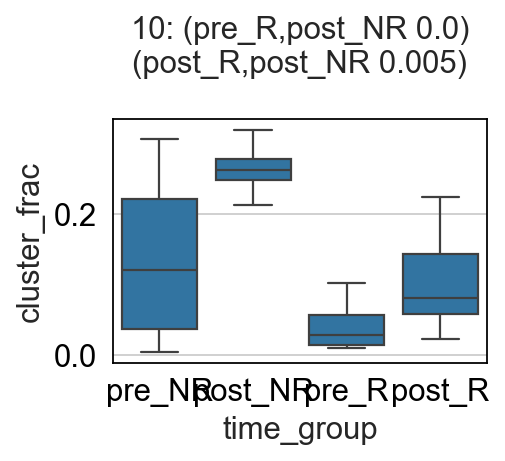

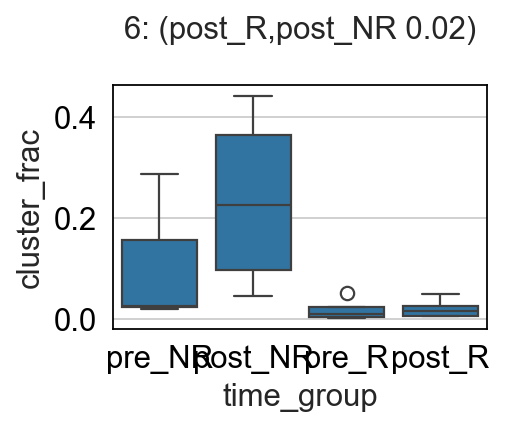

In [57]:
comparisons = ['pre_R,post_R', 'pre_R,post_NR', 'pre_R,pre_NR', 'pre_NR,post_R', 'pre_NR,post_NR', 'post_R,post_NR']

p_df = pd.DataFrame(index = np.unique(fc['cluster']), columns = comparisons)
# np.unique(fc['cluster'])
for niche in ['2','13','10','6']:
    df = fc[fc['cluster']==niche]
    string = 'none_significant'
    for comp in comparisons:
        # print(comp)
        a = comp.split(',')[0]
        b = comp.split(',')[1]
        df_sub1 = df[df['time_group']==a]
        df_sub2 = df[df['time_group']==b]
        t,p = ttest_ind(df_sub1['cluster_frac'],df_sub2['cluster_frac'])
        p_df.loc[celltype,comp] = np.round(p,3)
        if p<0.05:
            # print(string)
            # print(niche, comp, p)
            if string == 'none_significant':
                
                string = '(' + comp + ' ' + str(np.round(p,3)) + ')\n'
            else:    
                string += '(' + comp + ' ' + str(np.round(p,3)) + ')\n'
    if string ==  'none_significant': continue
    plt.figure(figsize = (3,2))
    sns.boxplot(data = df, x = 'time_group', y = 'cluster_frac', order = ['pre_NR','post_NR','pre_R','post_R'])
    plt.title(f'{niche}: {string}')
    plt.show()
    
    
    

In [73]:
fc

,sample_id,timepoint,group,cluster,cluster_size,smp_size,cluster_frac,time_group
0,R15_pre,pre,R,10,143,9224,0.015503,pre_R
1,R01_post,post,R,2,15,94,0.159574,post_R
2,R03_post,post,R,12,5,330,0.015152,post_R
3,NR02_post,post,NR,3,76,2796,0.027182,post_NR
4,R15_pre,pre,R,11,188,9224,0.020382,pre_R
...,...,...,...,...,...,...,...,...
229,R15_pre,pre,R,2,2874,9224,0.311578,pre_R
230,NR16_post,post,NR,5,1,3288,0.000304,post_NR
231,NR06_pre,pre,NR,13,28,633,0.044234,pre_NR
232,R11_post_A,post,R,15,524,6133,0.085439,post_R


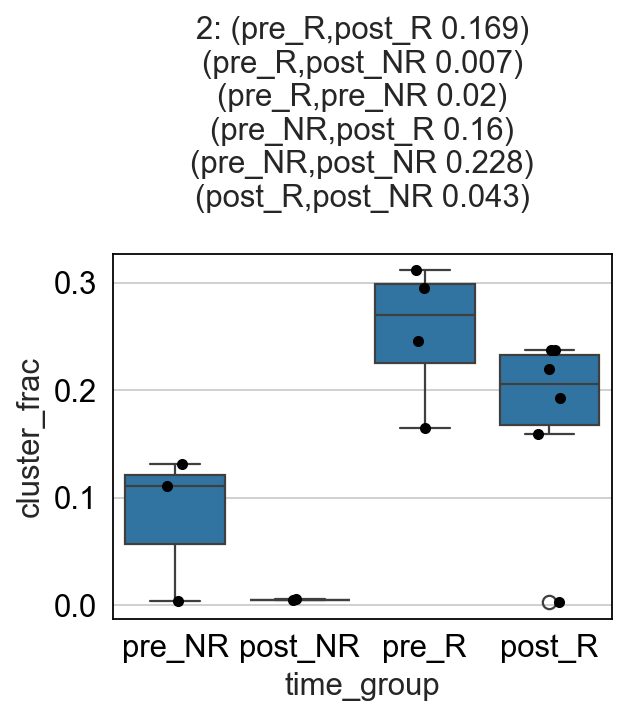

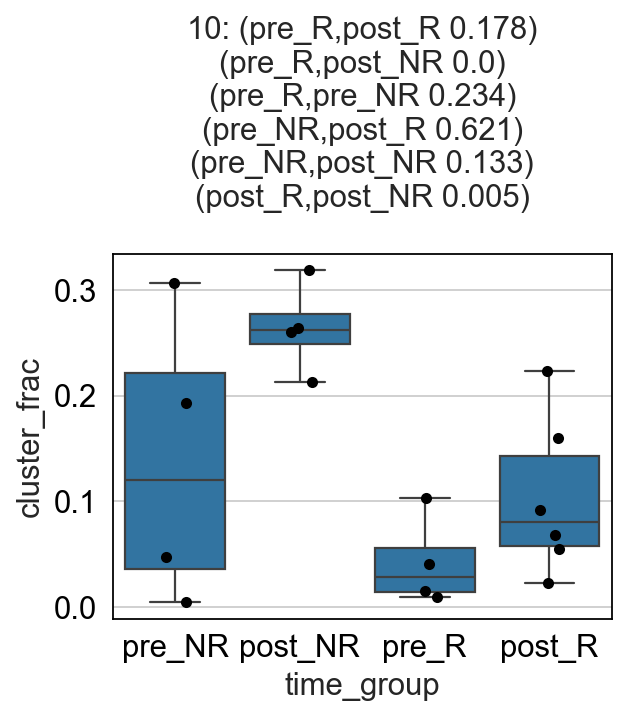

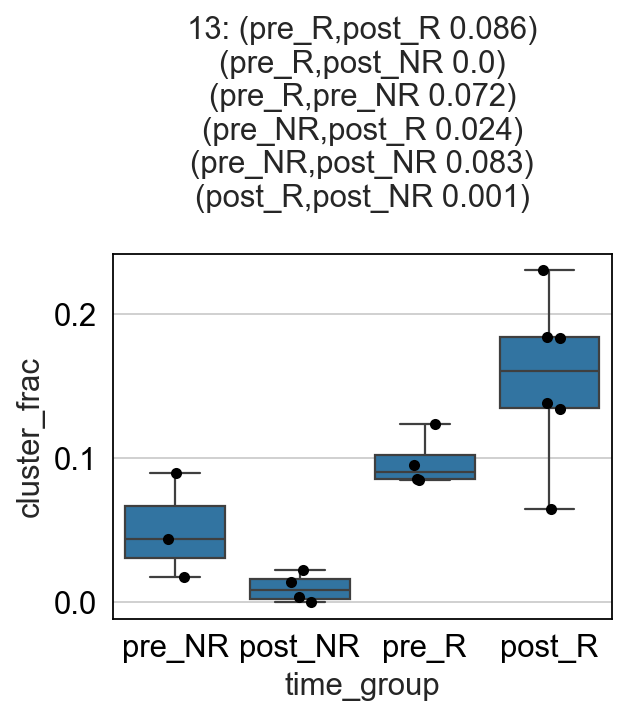

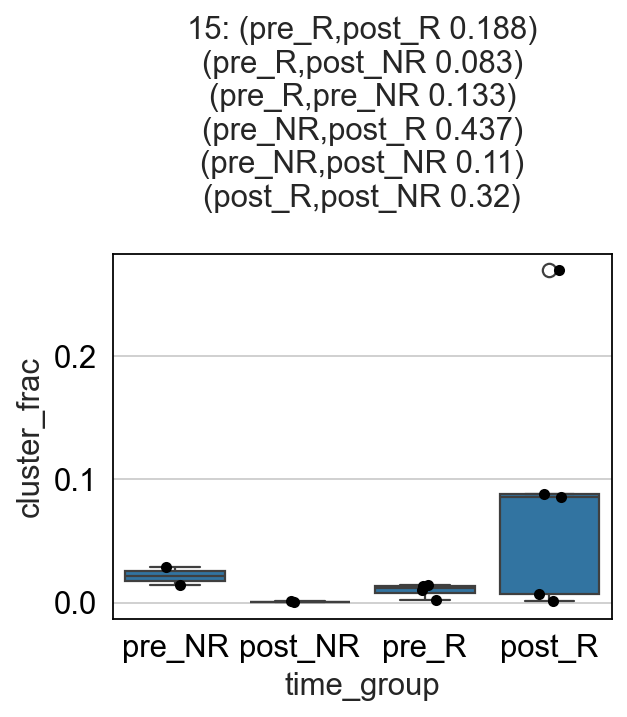

In [80]:
comparisons = ['pre_R,post_R', 'pre_R,post_NR', 'pre_R,pre_NR', 'pre_NR,post_R', 'pre_NR,post_NR', 'post_R,post_NR']

p_df = pd.DataFrame(index = np.unique(fc['cluster']), columns = comparisons)

# for niche in np.unique(fc['cluster']):
for niche in ['2','10','13','15']:
    df = fc[fc['cluster']==niche]
    string = 'none_significant'
    for comp in comparisons:
        # print(comp)
        a = comp.split(',')[0]
        b = comp.split(',')[1]
        df_sub1 = df[df['time_group']==a]
        df_sub2 = df[df['time_group']==b]
        t,p = ttest_ind(df_sub1['cluster_frac'],df_sub2['cluster_frac'])
        p_df.loc[celltype,comp] = np.round(p,3)
        # if p<0.05:
            # print(string)
            # print(niche, comp, p)
        if string == 'none_significant':
            
            string = '(' + comp + ' ' + str(np.round(p,3)) + ')\n'
        else:    
            string += '(' + comp + ' ' + str(np.round(p,3)) + ')\n'
    # if string ==  'none_significant': continue
    plt.figure(figsize = (4,3))
    sns.boxplot(data = df, x = 'time_group', y = 'cluster_frac', order = ['pre_NR','post_NR','pre_R','post_R'])
    sns.stripplot(data = df, x = 'time_group', y = 'cluster_frac', order = ['pre_NR','post_NR','pre_R','post_R'], color = 'black')
    plt.title(f'{niche}: {string}')
    # plt.savefig(f'./figures/{niche}_response_group_withdots.pdf')
    plt.show()

In [77]:
 ttest_ind(df_sub1['cluster_frac'],df_sub2['cluster_frac'])

TtestResult(statistic=1.102626397032073, pvalue=0.320411491718897, df=5.0)

In [78]:
fc[fc['cluster']=='15'].to_csv('niche_fractions_15.csv')
fc[fc['cluster']=='2'].to_csv('niche_fractions_2.csv')
fc[fc['cluster']=='6'].to_csv('niche_fractions_6.csv')
fc[fc['cluster']=='10'].to_csv('niche_fractions_10.csv')
fc[fc['cluster']=='13'].to_csv('niche_fractions_13.csv')

In [78]:
df_sub1

,sample_id,timepoint,group,cluster,cluster_size,smp_size,cluster_frac,time_group
10,R15_post,post,R,15,21,2911,0.007214,post_R
54,R03_post,post,R,15,89,330,0.269697,post_R
81,R13_post,post,R,15,258,2918,0.088417,post_R
112,R05_post,post,R,15,5,4935,0.001013,post_R
179,R11_post_A,post,R,15,524,6133,0.085439,post_R


In [79]:
df_sub2

,sample_id,timepoint,group,cluster,cluster_size,smp_size,cluster_frac,time_group
32,NR06_post_B,post,NR,15,1,1690,0.000592,post_NR
191,NR02_post,post,NR,15,3,2796,0.001073,post_NR


In [80]:
fc[fc['cluster']=='3'].to_csv('niche_fractions_3.csv')

In [79]:
# fc.to_csv('niche_fraction_diversity.csv')

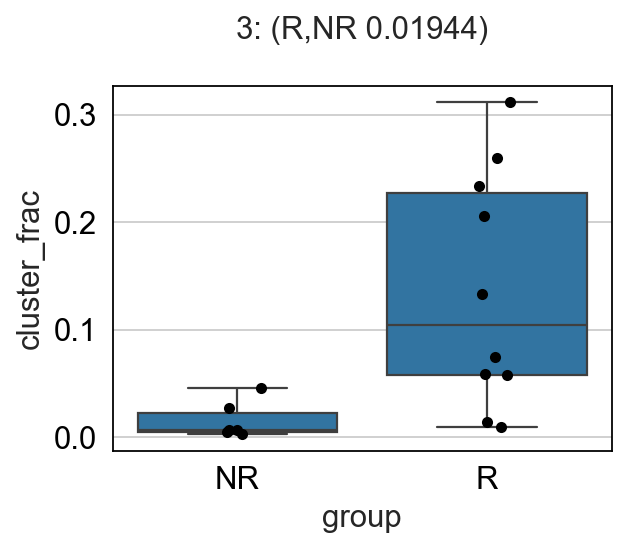

In [63]:
comparisons = ['R,NR']

p_df = pd.DataFrame(index = np.unique(fc['cluster']), columns = comparisons)
#np.unique(fc['cluster'])
for niche in ['3']:
    df = fc[fc['cluster']==niche]
    string = 'none_significant'
    for comp in comparisons:
        # print(comp)
        a = comp.split(',')[0]
        b = comp.split(',')[1]
        df_sub1 = df[df['group']==a]
        df_sub2 = df[df['group']==b]
        t,p = ttest_ind(df_sub1['cluster_frac'],df_sub2['cluster_frac'])
        p_df.loc[niche,comp] = np.round(p,3)
        if p<0.05:
            # print(string)
            # print(niche, comp, p)
            if string == 'none_significant':
                
                string = '(' + comp + ' ' + str(np.round(p,5)) + ')\n'
            else:    
                string += '(' + comp + ' ' + str(np.round(p,5)) + ')\n'
    if string ==  'none_significant': continue
    plt.figure(figsize = (4,3))
    sns.boxplot(data = df, x = 'group', y = 'cluster_frac', order = ['NR','R'])
    sns.stripplot(data = df, x = 'group', y = 'cluster_frac', order = ['NR','R'], color = 'black')
    plt.title(f'{niche}: {string}')
    plt.savefig(f'./figures/{niche}_R_NR_withdots.pdf')
    plt.show()
    

In [72]:
p

0.019441715692359557

In [73]:
p_df

,"R,NR"
1,NaN
10,NaN
11,NaN
12,NaN
13,NaN
14,NaN
15,NaN
16,NaN
2,NaN
3,0.019


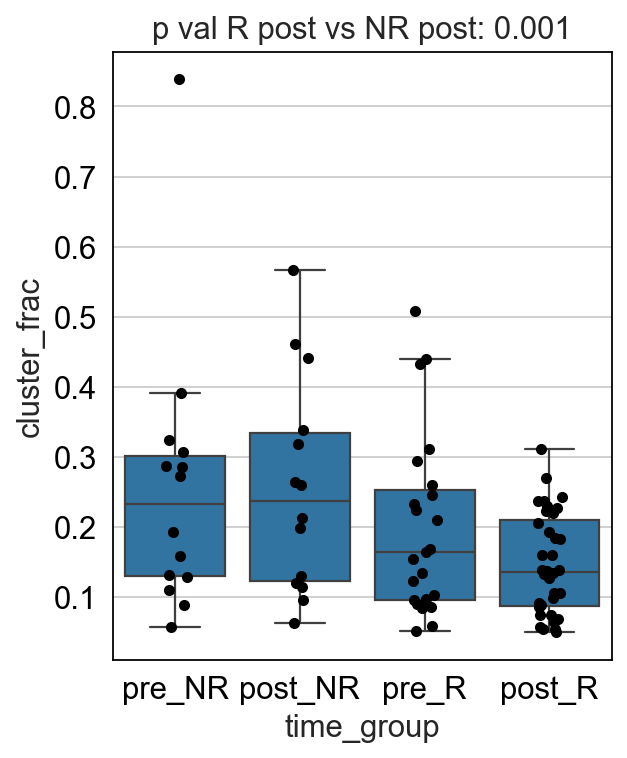

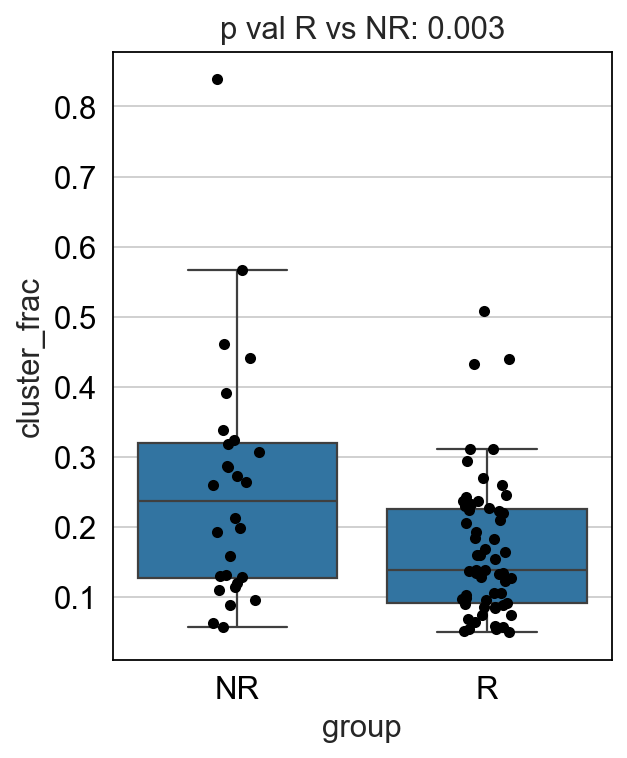

In [317]:
fc_sub =fc[fc['cluster_frac']>0.05]

r_post = fc_sub[fc_sub['time_group']=='post_R']
nr_post = fc_sub[fc_sub['time_group']=='post_NR']
r_pre = fc_sub[fc_sub['time_group']=='pre_R']
nr_pre = fc_sub[fc_sub['time_group']=='pre_NR']

t,p = ttest_ind(r_post['cluster_frac'],nr_post['cluster_frac'])
t,p2 = ttest_ind(r_pre['cluster_frac'],nr_pre['cluster_frac'])

plt.figure(figsize = (4,5))
sns.boxplot(data = fc_sub, x = 'time_group', y = 'cluster_frac', order = ['pre_NR','post_NR','pre_R','post_R'], showfliers = False)
sns.stripplot(data = fc_sub, x = 'time_group', y = 'cluster_frac', order = ['pre_NR','post_NR','pre_R','post_R'], color = 'black')
plt.title(f'p val R post vs NR post: {np.round(p,3)}')
plt.show()




r = fc_sub[fc_sub['group']=='R']
nr = fc_sub[fc_sub['group']=='NR']

t,p = ttest_ind(r['cluster_frac'],nr['cluster_frac'])

plt.figure(figsize = (4,5))
sns.boxplot(data = fc_sub, x = 'group', y = 'cluster_frac', order = ['NR', 'R'], showfliers = False)
sns.stripplot(data = fc_sub, x = 'group', y = 'cluster_frac', order = ['NR', 'R'], color = 'black')
plt.title(f'p val R vs NR: {np.round(p,3)}')
plt.show()


In [318]:
p2

0.29469415672626914

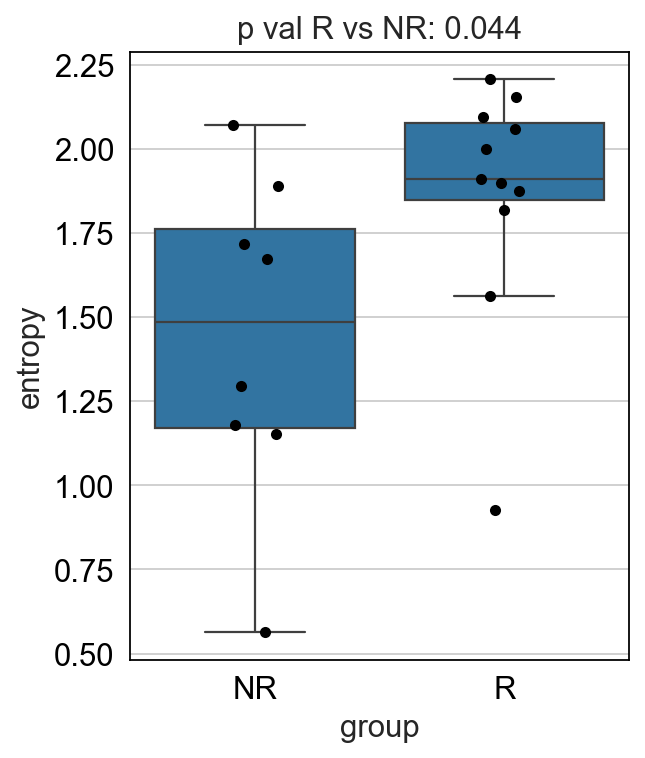

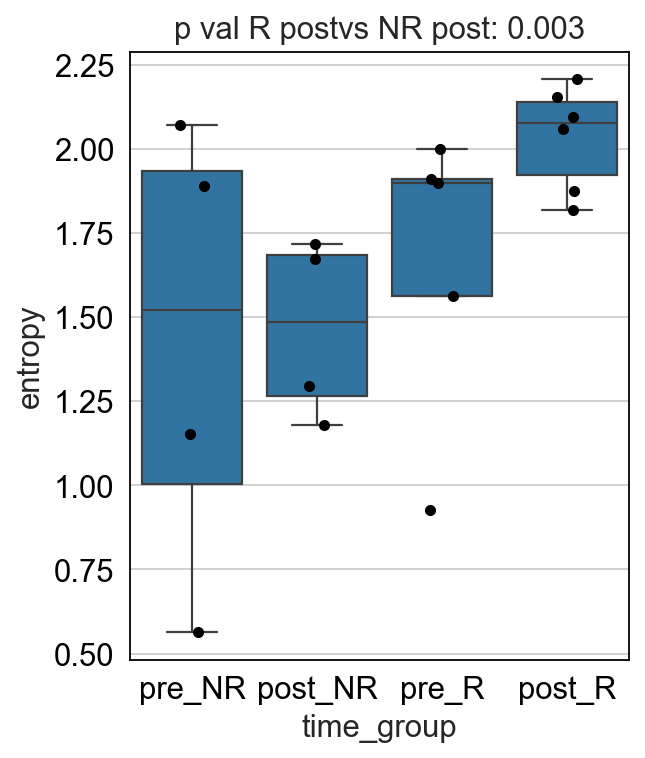

In [81]:
### for each sample what is entropy based on niche composition 
from scipy.stats import ttest_ind
sdf = pd.DataFrame(index = np.unique(fc['sample_id']), columns = [ 'group','time_group','entropy'])

for samp in np.unique(fc['sample_id']):
    sub = fc[fc['sample_id'] == samp]
    e = entropy(sub['cluster_frac'])
    ind = sub.iloc[0]
    arr = [ind['group'], ind['time_group'], e]
    sdf.loc[samp] = arr
    

r = sdf[sdf['group']=='R']
nr = sdf[sdf['group']=='NR']

t,p = ttest_ind(r['entropy'].astype(float),nr['entropy'].astype(float))

plt.figure(figsize = (4,5))
sns.boxplot(data = sdf, x = 'group', y = 'entropy',  showfliers = False)
sns.stripplot(data = sdf, x = 'group', y = 'entropy',  color = 'black')
plt.title(f'p val R vs NR: {np.round(p,3)}')
plt.show()



r_post = sdf[sdf['time_group']=='post_R']
nr_post = sdf[sdf['time_group']=='post_NR']
r_pre = sdf[sdf['time_group']=='pre_R']
nr_pre = sdf[sdf['time_group']=='pre_NR']


t,p1 = ttest_ind(r_post['entropy'].astype(float),nr_post['entropy'].astype(float))
t,p2 = ttest_ind(nr_pre['entropy'].astype(float),r_pre['entropy'].astype(float))
# print(p2)

plt.figure(figsize = (4,5))
sns.boxplot(data = sdf, x = 'time_group', y = 'entropy',  showfliers = False, order = ['pre_NR','post_NR','pre_R','post_R'])
sns.stripplot(data = sdf, x = 'time_group', y = 'entropy',order = ['pre_NR','post_NR','pre_R','post_R'],  color = 'black')
plt.title(f'p val R postvs NR post: {np.round(p1,3)}')
# plt.savefig('./figures/entropy_niche_fraction_by_sample_fixed_order.pdf')
plt.show()

In [83]:
sdf.to_csv('sample_entropy_niche_fractions.csv')

In [35]:
np.unique(sdf['time_group'], return_counts = True)

(array(['post_NR', 'post_R', 'pre_NR', 'pre_R'], dtype=object),
 array([4, 6, 4, 5]))

in niche types that are significant, want to see if TEMRA is involved and what are they interacting with 
niche 15 high in temras - does niche 15 have higher diversity compared to niche types 
which niche types enriched in temra -- do they have more immune diversity 
r post vs. nr post enriched niches to show differences in phenotype


In [257]:
r_enriched = [2,3,13]
nr_enriched = [10,6]

df = pd.DataFrame(adata.X.todense(), index = adata.obs.index, columns = adata.var.index)
df['celltype'] = adata.obs['transferred_ctype']
df['celltype_fine'] = adata.obs['celltype_fine']
df['cell_id'] = adata.obs['cell_id']
df = df[df['cell_id'].isin(mtx_copy['qry_cell_id'])]
df.index = df['cell_id']
mtx_copy.index = mtx_copy['qry_cell_id']
df['cluster'] = 0
df.loc[mtx_copy.index,'cluster'] = mtx_copy['cluster'].astype(int)
df.loc[mtx_copy.index,'response'] = mtx_copy['response']
df.loc[mtx_copy.index,'response_group'] = mtx_copy['response_group']

## limit to T cells
df = df[df['celltype']=='T-cell']

# r_df = df[df['response']=='R']
# nr_df = df[df['response']=='NR']


In [269]:
clusters = [2,3,6,10,13,15]
df_sub = df[df['cluster'].isin(clusters)]
# df_sub = df_sub[df_sub['response_group'].isin(['R_post','NR_post'])]

In [272]:
nr = df_sub[df_sub['response_group']=='NR_pre']
np.unique(nr['cluster'], return_counts = True)

(array([ 2,  3,  6, 10, 13, 15]), array([ 23,   6,  27, 115,  40, 106]))

In [260]:
from scipy.stats import zscore
genes = ['HAVCR2','CTLA4','TIGIT','LAG3','ICOS','GZMB','B3GAT1','TNFRSF4']
cdf = pd.DataFrame(index = clusters, columns = genes)
for cluster in clusters:

    sub = df_sub[df_sub['cluster']==cluster]
    cdf.loc[cluster] = sub[genes].mean()



cdfz = pd.DataFrame(index = clusters, columns = genes)
for gene in cdf.columns:
    cdfz[gene] = zscore(cdf[gene].astype(float))


cdf = cdf.loc[[10,6,2,3,13,15]]
cdfz = cdfz.loc[[10,6,2,3,13,15]]

    

In [266]:
temra = df[df['celltype_fine']=='CD8 TEMRA']
np.unique(temra['response_group'],return_counts = True)

(array(['NR_post', 'NR_pre', 'R_post', 'R_pre'], dtype=object),
 array([ 176,  589, 1097,  864]))

In [264]:
# sns.heatmap(cdf.astype(float).T, 
#            # vmin = -1.3, vmax = 1.3,
#            cmap = 'vlag')

In [232]:
r_post = df_sub[df_sub['response_group']=='R_post']
r_pre = df_sub[df_sub['response_group']=='R_pre']

nr_post = df_sub[df_sub['response_group']=='NR_post']
nr_pre = df_sub[df_sub['response_group']=='NR_pre']


concat = pd.concat([nr_post, nr_pre, r_pre, r_post])
concat


,ALCAM,B3GAT1,BACH2,BCL11B,CCL5,CCR5,CCR7,CD14,CD160,CD163,...,XBP1,XCL1,XCL2,ZNF683,celltype,celltype_fine,cell_id,cluster,response,response_group
cell_id,,,,,,,,,,,,,,,,,,,,,
NR02_post_167857,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.0,0.0,T-cell,CD4 T-cell,NR02_post_167857,10,NR,NR_post
NR02_post_168037,0.000000,0.0,1.016934,0.0,0.000000,0.000000,0.000000,0.000000,0.0,1.016934,...,1.016934,0.0,0.0,0.0,T-cell,CD4 T-cell,NR02_post_168037,10,NR,NR_post
NR02_post_168179,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.0,0.0,T-cell,CD4 T-cell,NR02_post_168179,10,NR,NR_post
NR02_post_168206,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,2.302585,0.0,0.0,0.0,T-cell,CD4 T-cell,NR02_post_168206,10,NR,NR_post
NR02_post_168244,1.510592,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.0,0.0,T-cell,CD8 Memory,NR02_post_168244,10,NR,NR_post
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R15_post_141916,0.000000,0.0,0.000000,0.0,0.980829,0.000000,0.000000,0.980829,0.0,0.000000,...,0.000000,0.0,0.0,0.0,T-cell,CD8 Memory,R15_post_141916,2,R,R_post
R15_post_142024,0.000000,0.0,0.000000,0.0,1.223775,0.788457,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.0,0.0,T-cell,CD8 TEMRA,R15_post_142024,13,R,R_post
R15_post_142177,0.000000,0.0,0.916291,0.0,1.945910,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.0,0.0,0.0,T-cell,CD8 TEMRA,R15_post_142177,10,R,R_post


proportion of every niche in every sample and seeing if the proportions are enriched in any response group for any niche type 
diversity of sample with niche makeup
seeing if cd8 temra are more enriched in proportion in neighborhood 15 vs. other neighborhoods

<Axes: xlabel='cell_id'>

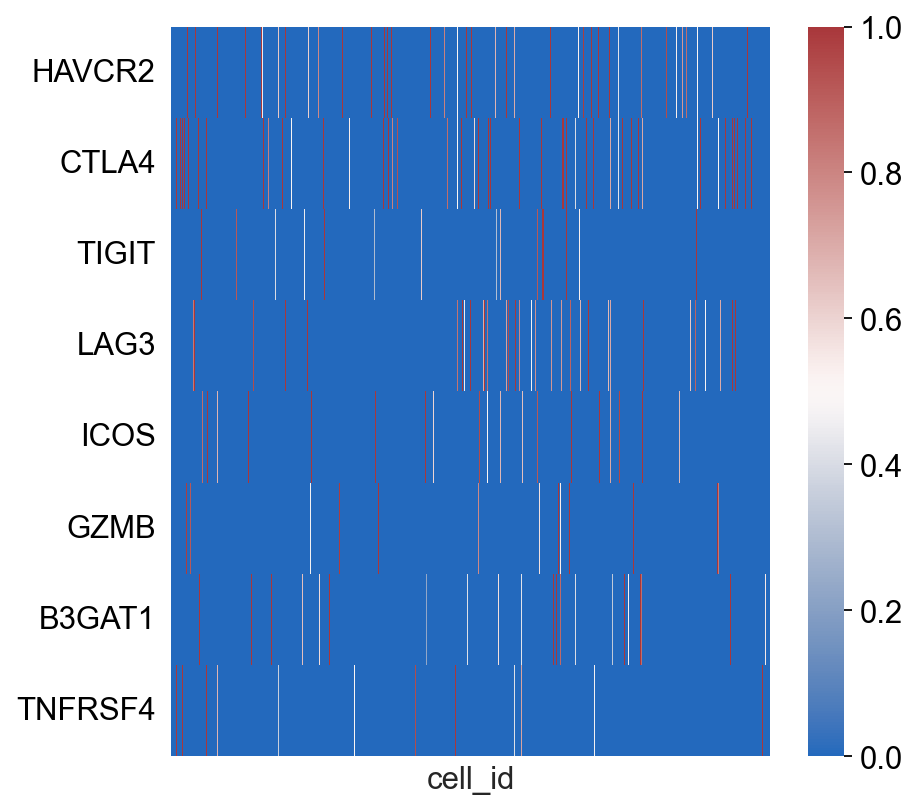

In [234]:
sns.heatmap(concat[['HAVCR2','CTLA4','TIGIT','LAG3','ICOS','GZMB','B3GAT1','TNFRSF4']].T, xticklabels = 0, 
            vmax = 1,
            cmap = 'vlag')

### plot celltype composition of detected niches

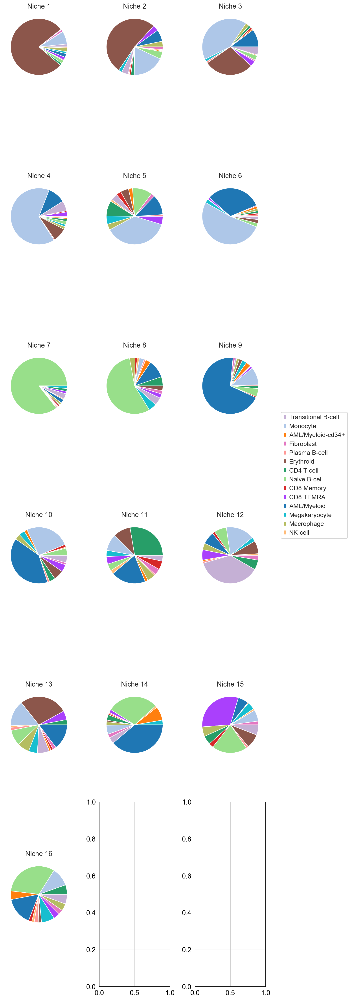

In [68]:
df = cluster_assign.unpivot(on=cluster_assign.columns[3:17], index='cluster', variable_name='celltype', value_name='fraction').group_by('cluster', 'celltype').agg(pl.mean('fraction')).sort('cluster').rename({'cluster': 'niche'})

# Get unique clusters
clusters = df['niche'].unique()

# Determine the layout of the subplots
n_clusters = len(clusters)
ncols = 3
nrows = (n_clusters // ncols) + (n_clusters % ncols > 0)

fig, axs = plt.subplots(nrows, ncols, figsize=(8, 5 * nrows))

# Define custom colors
keys = list(adata.obs['celltype_fine'].cat.categories)
values = sc.pl.palettes.default_20


color_mapping = {keys[i]: values[i] for i in range(len(keys))}

if nrows == 1:
    axs = axs.reshape(-1)

# Collect labels and handles for the legend
labels_set = set()
handles_set = {}

for i, cluster in enumerate(clusters):
    # Filter data for the current cluster
    cluster_data = df.filter(pl.col('niche') == cluster)
    
    # Determine the position of the subplot
    ax = axs[i // ncols, i % ncols] if nrows > 1 else axs[i % ncols]

    colors = [color_mapping[celltype] for celltype in cluster_data['celltype'].to_list()]
    
    # Plot pie chart
    wedges, texts = ax.pie(cluster_data['fraction'].to_numpy(), labels=None, colors=colors)
    #wedges, texts, autotexts = ax.pie(cluster_data['fraction'].to_numpy(), labels=None, autopct='%1.1f%%', colors=colors)
    ax.set_title(f'Niche {cluster}')
    
    # Collect legend labels and handles
    for wedge, celltype in zip(wedges, cluster_data['celltype']):
        if celltype not in labels_set:
            labels_set.add(celltype)
            handles_set[celltype] = wedge


# plt.subplots_adjust(wspace=0, hspace=-0.75)
# Create a single legend
fig.legend(handles_set.values(), handles_set.keys(), loc='center left', bbox_to_anchor=(1, 0.5))
fig.tight_layout()
# plt.savefig('./figures/niche_by_celltype_piecharts.pdf')
#plt.tight_layout(rect=[0, 0, 0.5, 0])
plt.show()

In [69]:
niche_comp = pd.DataFrame(columns = ['niche', 'celltype', 'fraction'])

for col in df.columns: 
    niche_comp[col] = df[col]

In [75]:
high = niche_comp[niche_comp['fraction']>0.25]
high[high['niche'].isin([3,15,2,13,10,6])]

,niche,celltype,fraction
17,2,Erythroid,0.522730
33,3,Monocyte,0.416291
36,3,Erythroid,0.285236
76,6,AML/Myeloid,0.320672
80,6,Monocyte,0.519630
129,10,Monocyte,0.257048
133,10,AML/Myeloid,0.397488
170,13,Erythroid,0.276458
202,15,CD8 TEMRA,0.307743


In [74]:
niche_comp[niche_comp['niche']==13]

,niche,celltype,fraction
168,13,CD4 T-cell,0.029639
169,13,CD8 TEMRA,0.050979
170,13,Erythroid,0.276458
171,13,Monocyte,0.148042
172,13,NK-cell,0.009330
173,13,Plasma B-cell,0.017547
174,13,Naive B-cell,0.089484
175,13,Macrophage,0.069599
176,13,Megakaryocyte,0.050773
177,13,Transitional B-cell,0.068775


In [170]:
temra = niche_comp[niche_comp['celltype']=='CD8 TEMRA']
temra.sort_values(by = 'fraction')

,niche,celltype,fraction
79,6,CD8 TEMRA,0.011008
120,9,CD8 TEMRA,0.012396
88,7,CD8 TEMRA,0.013751
4,1,CD8 TEMRA,0.016976
194,14,CD8 TEMRA,0.017629
105,8,CD8 TEMRA,0.023852
54,4,CD8 TEMRA,0.024800
36,3,CD8 TEMRA,0.031864
25,2,CD8 TEMRA,0.032940
222,16,CD8 TEMRA,0.034925
